<a href="https://colab.research.google.com/github/sdemirus/PumpSureAI/blob/main/Data_wrangling_and_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Useful Functions**

In [ ]:
def check_df(df, head=5):
    print("\n", "\033[1m" + "#"*15, "DataFrame Overview", "#"*15 + "\033[0m")
    print("\n - Shape of DataFrame:", df.shape)

    print("\n", "\033[1m" + "#"*15, "DataFrame Info", "#"*15 + "\033[0m", "\n")
    df.info()

    print("\n", "\033[1m" + "#"*15, "Sample Data", "#"*15 + "\033[0m")
    print("\n- First {} Rows:\n".format(head), df.head(head))
    print("\n- Last {} Rows:\n".format(head), df.tail(head))

    print("\n", "\033[1m" + "#"*15, "Missing Values", "#"*15 + "\033[0m")
    na_counts = df.isnull().sum().sort_values(ascending = False)
    print("\n - Missing Values per Column:\n", na_counts[na_counts > 0] if na_counts.sum() > 0 else "No missing values")

    print("\n", "\033[1m" + "#"*15, "Numerical Data Statistics", "#"*15 + "\033[0m")
    numeric_df = df.select_dtypes(include=['number'])
    pd.options.display.float_format = '{:.5f}'.format
    if not numeric_df.empty:
        print("\n- Descriptive Statistics:\n", numeric_df.describe().T)
        pd.options.display.float_format = '{:.2f}'.format
        print("\n- Quantiles:\n", numeric_df.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)
    else:
        print("\n- No numerical columns available.")
    print("\n", "\033[1m" + "#"*15, "Time Series Analysis", "#"*15 + "\033[0m")
    if isinstance(df.index, pd.DatetimeIndex):
        print("\n- Index is a DatetimeIndex.")
        print("\n- Date Range:")
        print("  Start Date     :", df.index.min())
        print("  End Date       :", df.index.max())
        print("  Time difference: ", df.index.max()-df.index.min())
        print("\n- Frequency Analysis:")
        print(df.index.to_series().diff().value_counts().head())
    else:
        print("\n- Index is not datetime-based. Time series analysis not available.")

In [ ]:
def missing_values_table(dataframe, na_name=False):
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]

    n_miss = dataframe[na_columns].isnull().sum().sort_values(ascending=False)
    ratio = (dataframe[na_columns].isnull().sum() / dataframe.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis=1, keys=['n_miss', 'ratio'])
    print(missing_df, end="\n")

    if na_name:
        return na_columns
    else:
        return None

In [ ]:
def missing_vs_target(df, na_column, target):
    # Filter rows where `na_column` has missing values and group by target
    missing_counts = df[df[na_column].isna()].groupby(target).size()

    # Get total count of each target class
    total_counts = df.groupby(target).size()

    # Calculate missing ratio
    missing_ratios = (missing_counts / total_counts * 100).fillna(0)

    # Combine results into a DataFrame
    result = pd.DataFrame({
        'Missing Count': missing_counts,
        'Total Count': total_counts,
        'Missing Ratio (%)': missing_ratios
    }).fillna(0)  # Fill NaN values with 0 for classes without missing values

    return result

In [ ]:
def outlier_thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

In [ ]:
def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [ ]:
def check_outlier(dataframe, col_name, q1=0.05, q3=0.95):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name, q1, q3)
    outliers = (dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)
    return outliers.any()

In [ ]:
def high_correlated_cols_time_series(dataframe, plot=True, corr_th=0.90, resample_freq="T"):
    # Resample data to specified frequency
    resampled_df = dataframe.resample(resample_freq).mean()

    # Compute correlation on resampled data
    corr = resampled_df.corr()
    cor_matrix = corr.abs()
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]

    # Plot the correlation matrix if needed
    if plot:
        fig = plt.gcf()
        fig.set_size_inches(14, 14)
        plt.xticks(fontsize=9)
        plt.yticks(fontsize=9)
        fig = sns.heatmap(corr, annot=True, linewidths=0.5, annot_kws={'size': 9}, linecolor='w', cmap='RdBu', fmt=".2f")
        plt.title(f'Correlation Matrix (Resampled to {resample_freq})')
        plt.show()

    return drop_list

# **Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import seaborn as sns
import missingno as msno
import zipfile

from sklearn.impute import KNNImputer
from statsmodels.tsa.seasonal import STL

import warnings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 500)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
warnings.filterwarnings('ignore')

# **Data Wrangling and EDA**

## Load and Explore the Data

In [ ]:
# Load dataset from a compressed CSV file, this approach helps when handling large datasets
zip_path = '/content/drive/MyDrive/Colab Notebooks/pumpsureai/sensor.csv.zip'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    with zip_ref.open('sensor.csv') as file:
        df = pd.read_csv(file)
df.head()

In [ ]:
check_df(df)


 ############### DataFrame Overview ###############

 - Shape of DataFrame: (220320, 55)

 ############### DataFrame Info ############### 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220320 entries, 0 to 220319
Data columns (total 55 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      220320 non-null  int64  
 1   timestamp       220320 non-null  object 
 2   sensor_00       210112 non-null  float64
 3   sensor_01       219951 non-null  float64
 4   sensor_02       220301 non-null  float64
 5   sensor_03       220301 non-null  float64
 6   sensor_04       220301 non-null  float64
 7   sensor_05       220301 non-null  float64
 8   sensor_06       215522 non-null  float64
 9   sensor_07       214869 non-null  float64
 10  sensor_08       215213 non-null  float64
 11  sensor_09       215725 non-null  float64
 12  sensor_10       220301 non-null  float64
 13  sensor_11       220301 non-null  float64
 14  sensor_

In [ ]:
# Drop the 'Unnamed: 0' column, as it contains only redundant information
df.drop('Unnamed: 0', axis = 1, inplace = True)

In [ ]:
# Convert 'timestamp' to datetime and set as index
df['timestamp'] = pd.to_datetime(df['timestamp'])
df.set_index('timestamp', inplace = True)

In [ ]:
# Set the frequency to minute intervals
df = df.asfreq('T')
df.index.freq

<Minute>

#### machine_status distribution

In [ ]:
df['machine_status'].unique()

array(['NORMAL', 'BROKEN', 'RECOVERING'], dtype=object)

In [ ]:
value_counts = df['machine_status'].value_counts()
value_ratios = df['machine_status'].value_counts(normalize=True) * 100
pd.DataFrame({'Count': value_counts, 'Ratio (%)': value_ratios})

,Count,Ratio (%)
machine_status,,
NORMAL,205836,93.43
RECOVERING,14477,6.57
BROKEN,7,0.00


## Zero Value Analysis for Sensors

In [ ]:
# Define sensor columns
sensor_columns = [col for col in df.columns if 'sensor' in col]

# Find sensors with minimum value of 0
sensors_with_zero_min = [col for col in sensor_columns if df[col].min() == 0]
sensor_count_with_zero_min = len(sensors_with_zero_min)

# Calculate the zero percentage, total count of zero values, count of zero values when machine_status is not "NORMAL", and count of NaN values for each sensor
zero_statistics = {
    col: {
        "Zero_Percentage": (df[col] == 0).mean() * 100,
        "Zero_Count": (df[col] == 0).sum(),
        "Non_Normal_Zero_Count": df[(df['machine_status'] != 'NORMAL') & (df[col] == 0)].shape[0],
        "NaN_Count": df[col].isna().sum()
    }
    for col in sensors_with_zero_min
}

# Convert the dictionary to a DataFrame
zero_statistics_df = pd.DataFrame.from_dict(zero_statistics, orient='index').reset_index().sort_values(by='Zero_Percentage', ascending=False)
zero_statistics_df.columns = ['Sensor', 'Zero_Percentage', 'Zero_Count', 'Non_Normal_Zero_Count', 'NaN_Count']

print("Sensors with minimum value of 0:", sensors_with_zero_min)
print("Count of sensors with minimum value of 0:", sensor_count_with_zero_min)
print("\nZero Percentage, Count, Non-NORMAL Zero Count, and NaN Count for Each Sensor:")
print(zero_statistics_df)

Sensors with minimum value of 0: ['sensor_00', 'sensor_01', 'sensor_05', 'sensor_07', 'sensor_09', 'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25', 'sensor_27', 'sensor_30', 'sensor_35', 'sensor_37']
Count of sensors with minimum value of 0: 22

Zero Percentage, Count, Non-NORMAL Zero Count, and NaN Count for Each Sensor:
       Sensor  Zero_Percentage  Zero_Count  Non_Normal_Zero_Count  NaN_Count
12  sensor_19             7.58       16692                      4         16
8   sensor_13             6.87       15142                  13932         19
11  sensor_18             6.82       15021                      0         46
10  sensor_17             6.78       14940                      0         46
14  sensor_22             6.68       14725                      0         41
21  sensor_37             6.53       14395                    112         16
17  sensor_25    

In [ ]:
# Replace zeros in sensor columns with NaN
# df[sensor_columns] = df[sensor_columns].replace(0, np.nan)

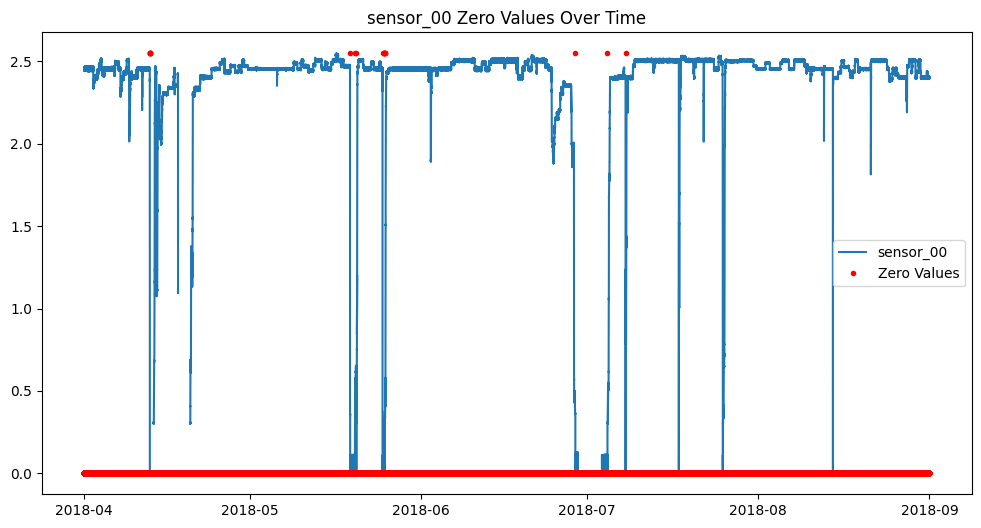

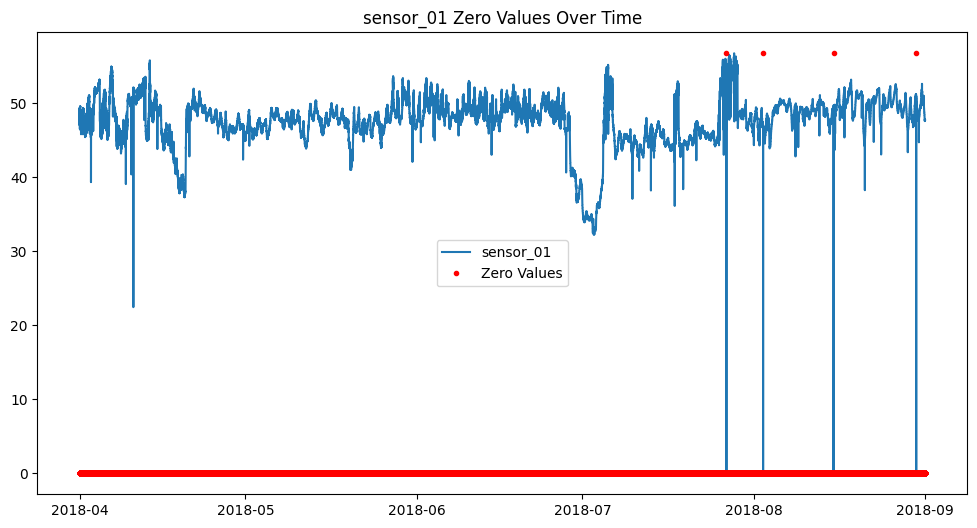

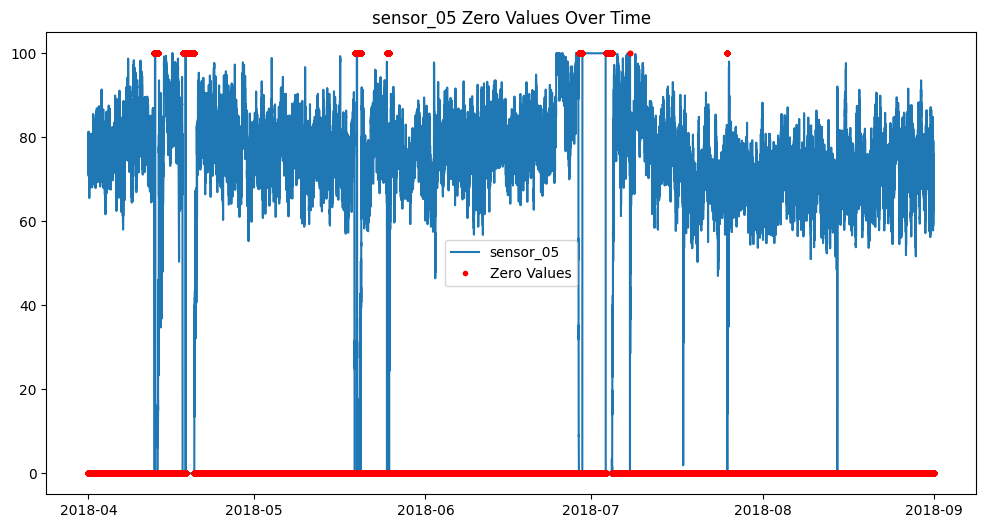

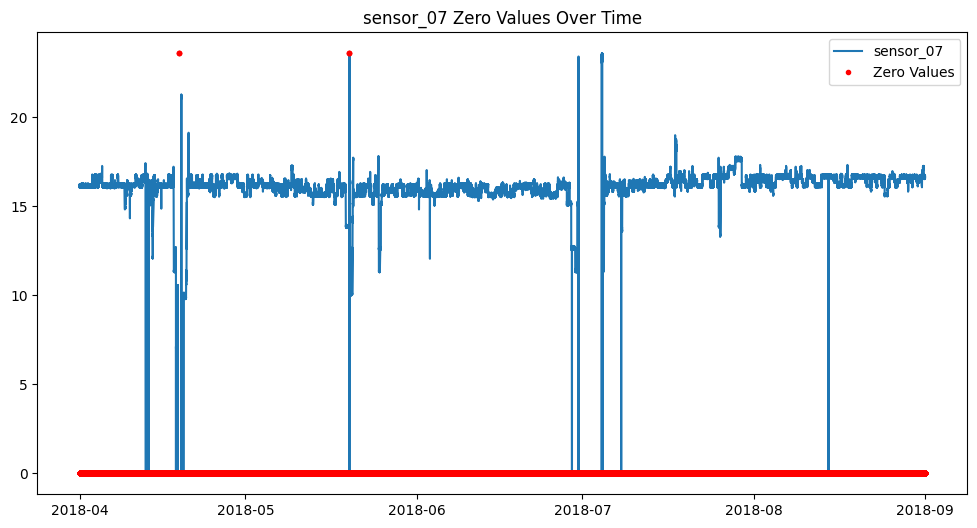

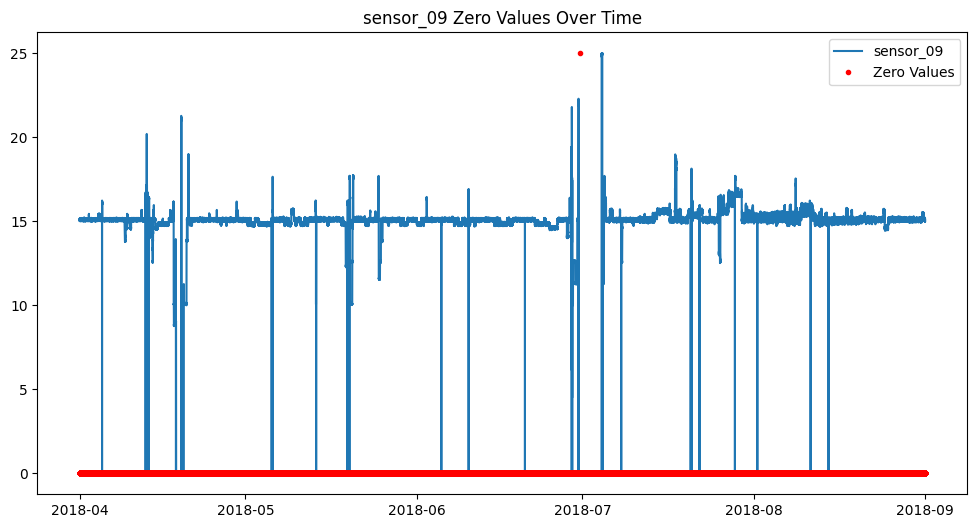

...

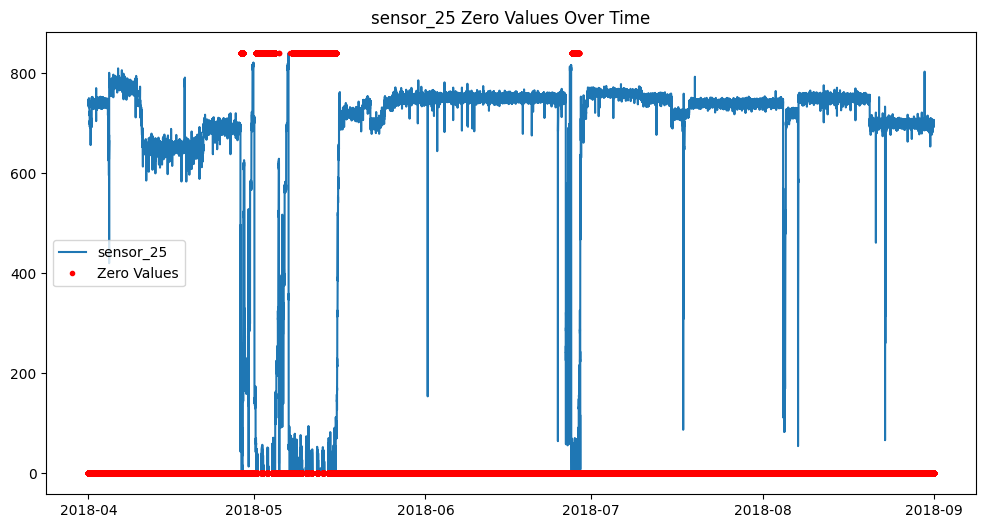

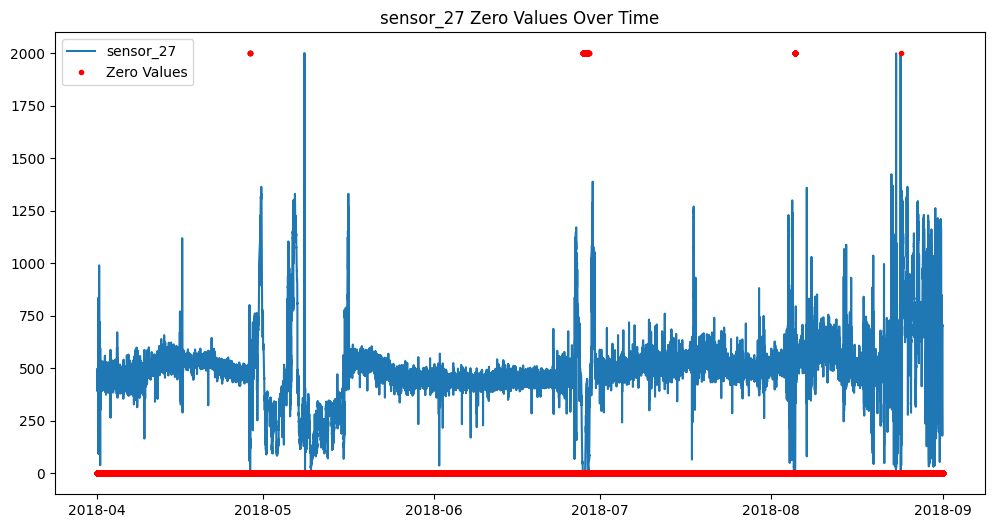

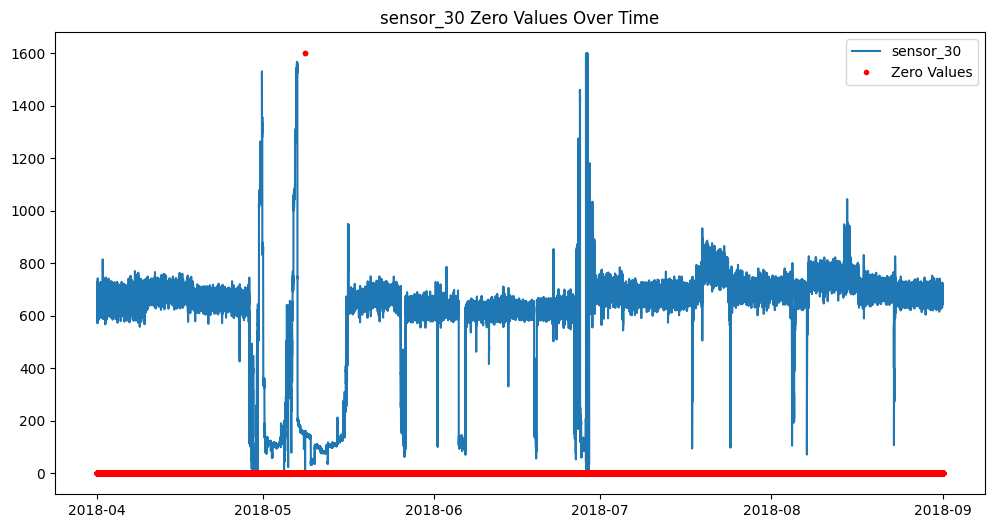

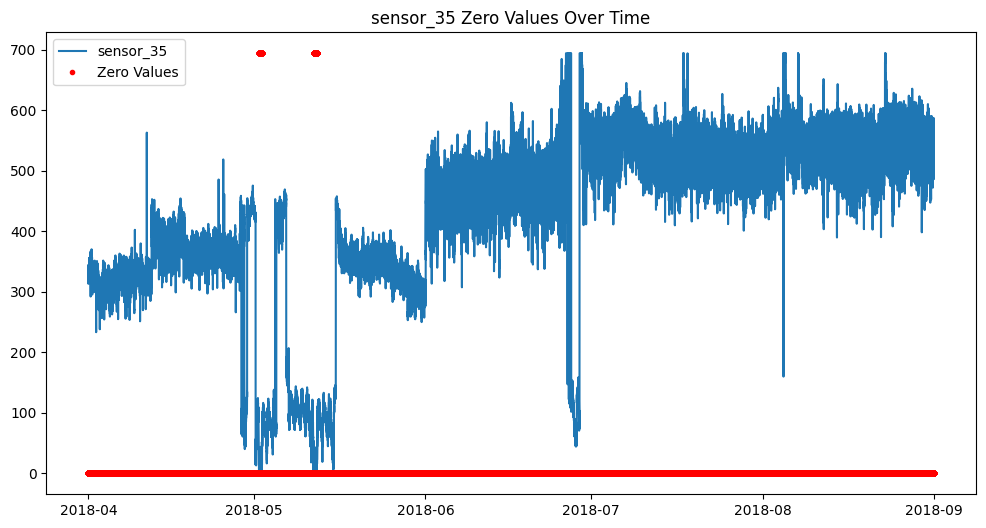

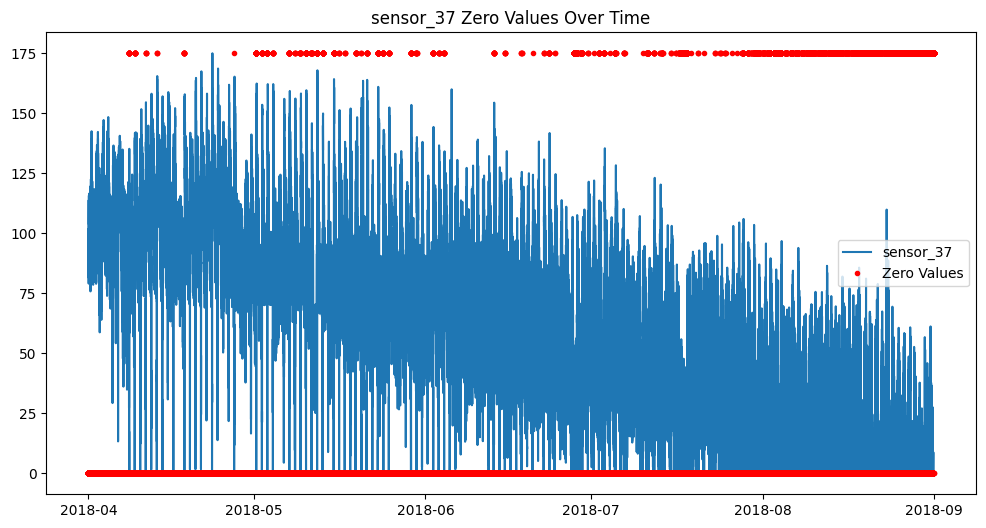

In [ ]:
# if zero values appear due to sudden changes.

# Mark zero and non-zero values
for sensor_column in sensors_with_zero_min:
    df['is_zero'] = (df[sensor_column] == 0).astype(int)  # Create a binary indicator for zero values

    # Visualize zero values in the time series
    plt.figure(figsize=(12, 6))
    plt.plot(df[sensor_column], label=sensor_column)  # Plot the sensor values
    plt.plot(df['is_zero'] * df[sensor_column].max(), 'r.', label='Zero Values')  # Highlight zero values
    plt.legend()
    plt.title(f'{sensor_column} Zero Values Over Time')
    plt.show()

df.drop('is_zero', axis=1, inplace = True)
# Note:
# Isolated zero values typically indicate data loss or recording issues,
# while zeros that appear at regular intervals might be normal behavior for the sensor.

Isolated zero values often suggest missing or faulty data, whereas zeros appearing at consistent intervals may indicate expected behavior.

In [ ]:
# Identifying anomalous zero values in sensor data using z-scores
from scipy.stats import zscore

for sensor_column in sensors_with_zero_min:
    df['is_zero'] = (df[sensor_column] == 0).astype(int)
    # Calculate z-scores and check if zeros are anomalies
    df['z_score'] = zscore(df[sensor_column].replace(0, np.nan))
    df['is_anomaly'] = np.abs(df['z_score']) > 2  # z > 2 is considered an anomaly

print(len(df[df['is_anomaly'] == True]))
del df['is_zero']
del df['z_score']
del df['is_anomaly']

0


There is no anomalies detected among the observations with zero values across the sensors.

STL: Seasonal-Trend (Time Series) Decomposition

STL Decomposition for sensor_00


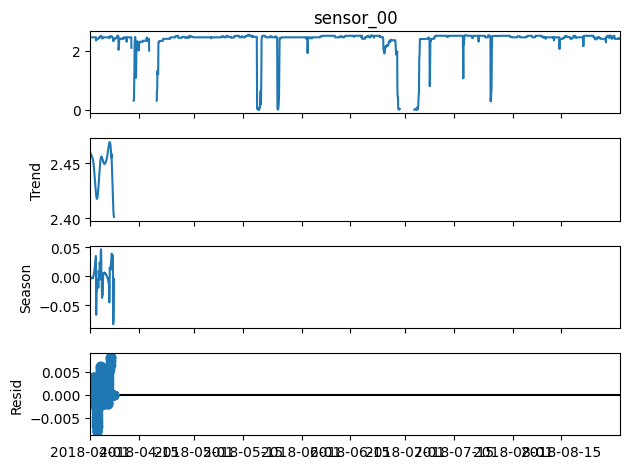

STL Decomposition for sensor_01


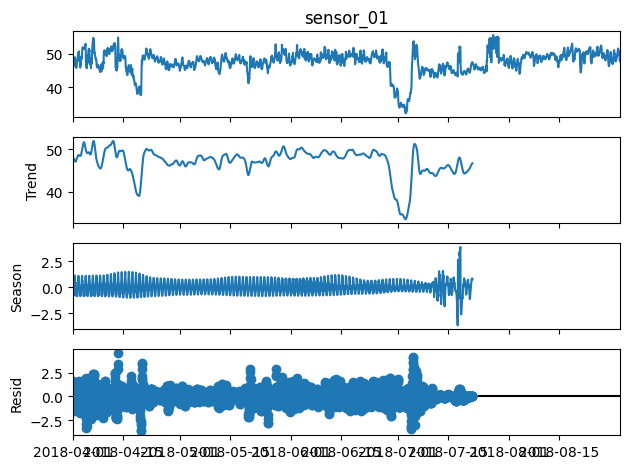

STL Decomposition for sensor_02


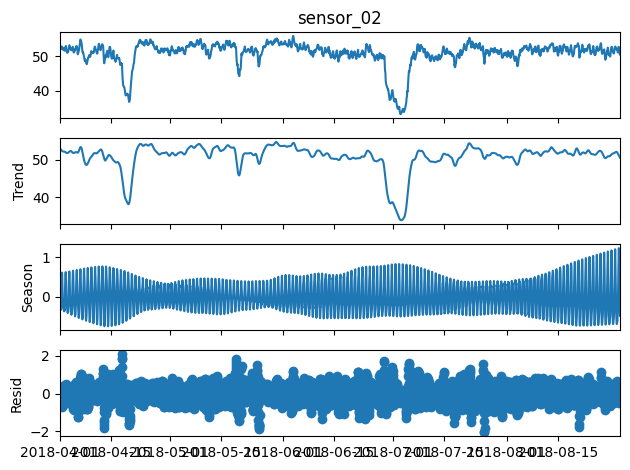

STL Decomposition for sensor_03


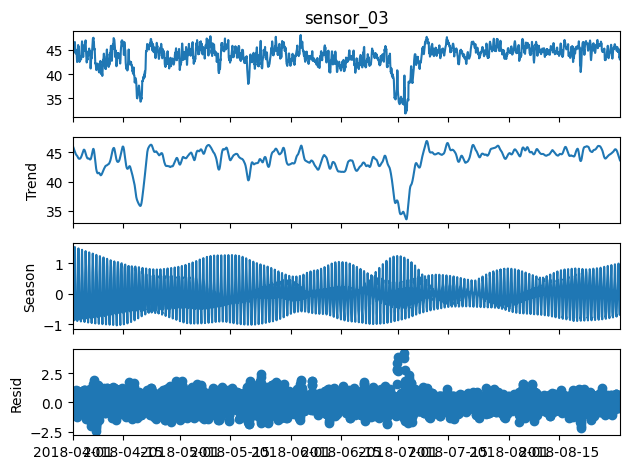

STL Decomposition for sensor_04


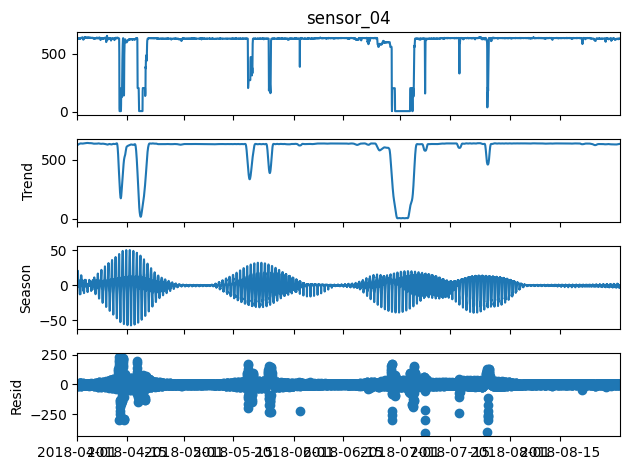

STL Decomposition for sensor_05


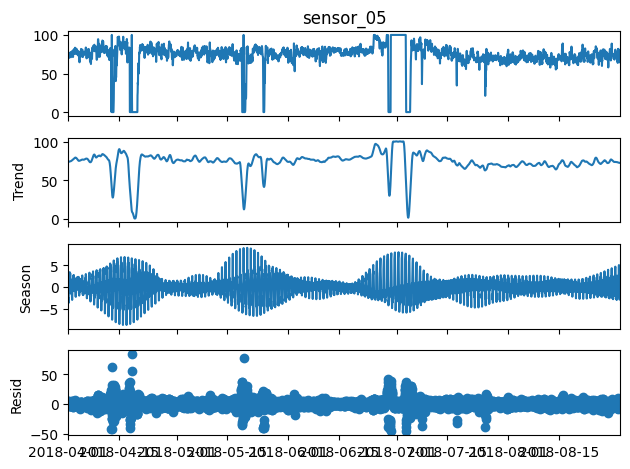

STL Decomposition for sensor_06


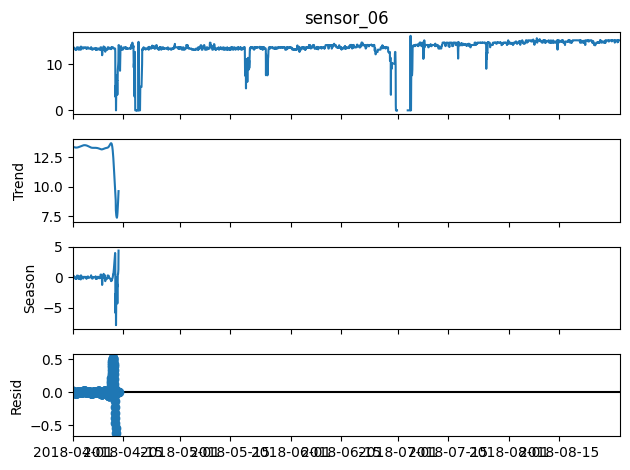

STL Decomposition for sensor_07


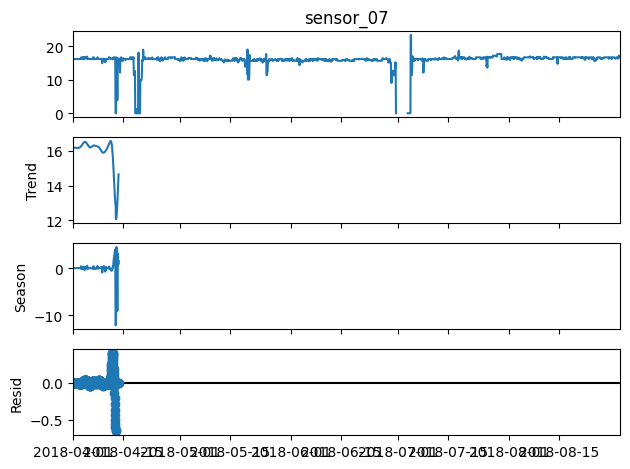

STL Decomposition for sensor_08


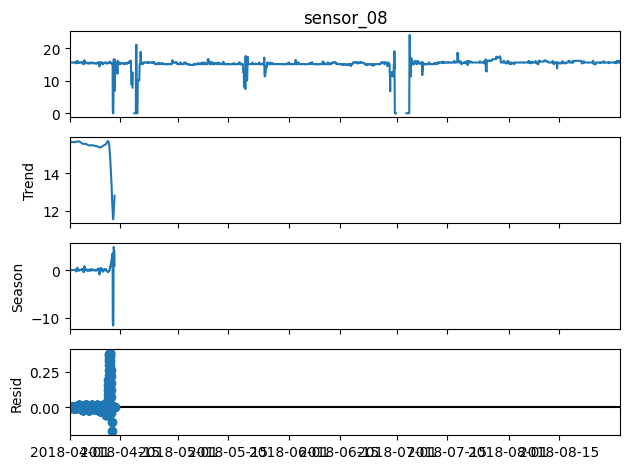

STL Decomposition for sensor_09


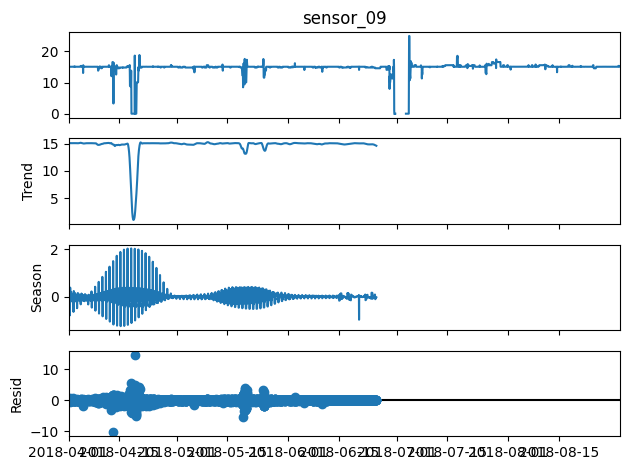

STL Decomposition for sensor_10


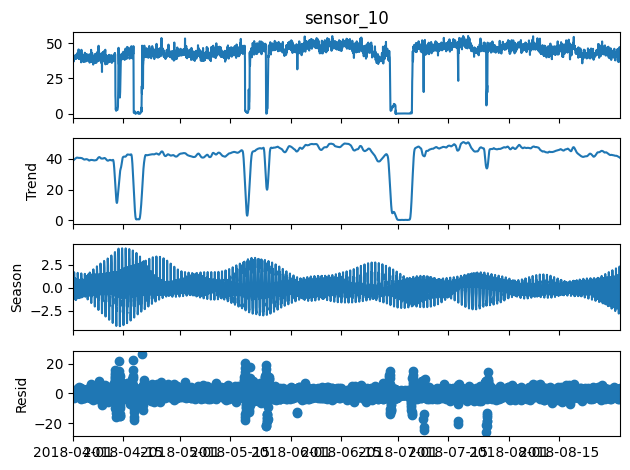

STL Decomposition for sensor_11


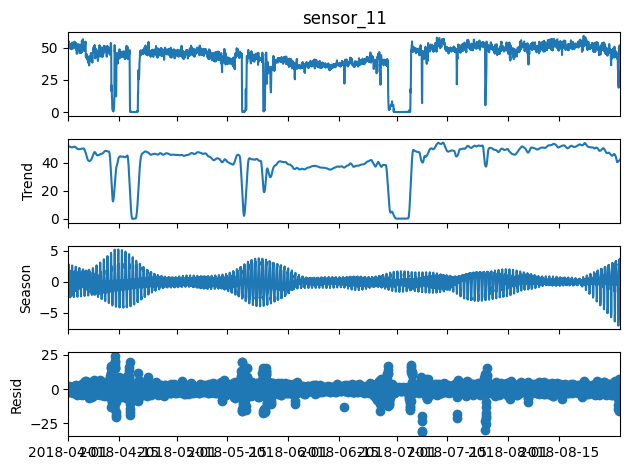

STL Decomposition for sensor_12


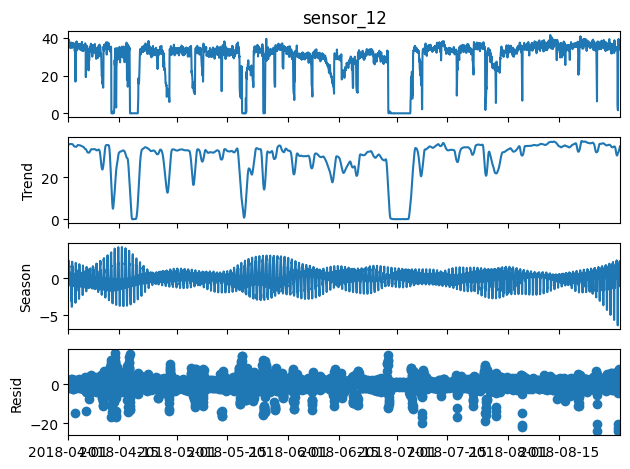

STL Decomposition for sensor_13


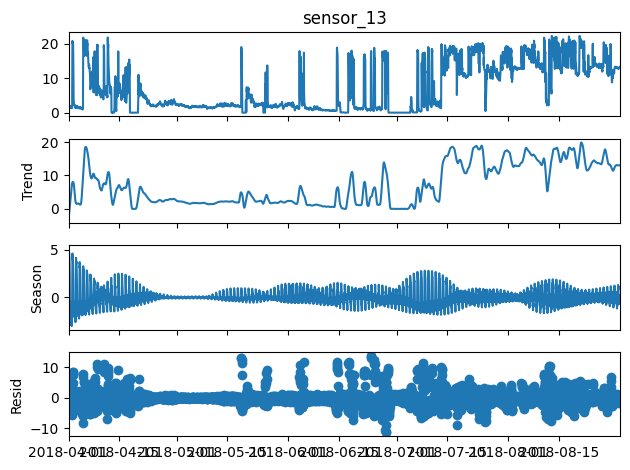

STL Decomposition for sensor_14


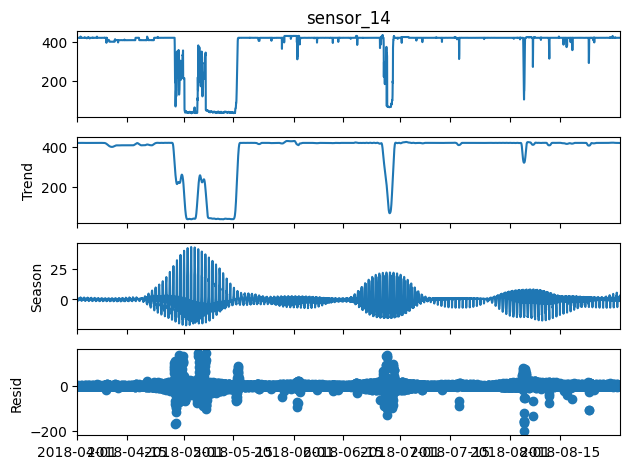

STL Decomposition for sensor_15


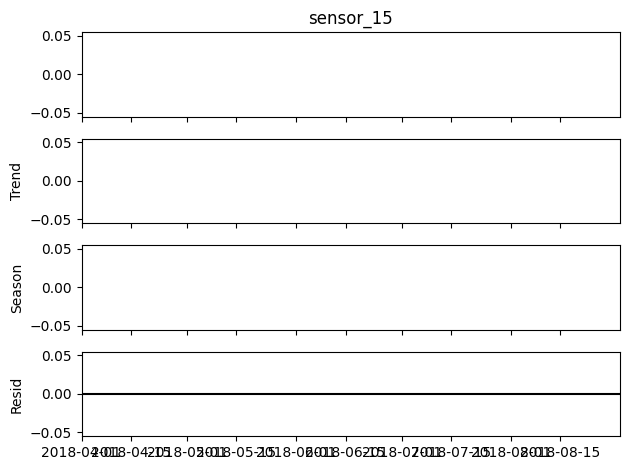

STL Decomposition for sensor_16


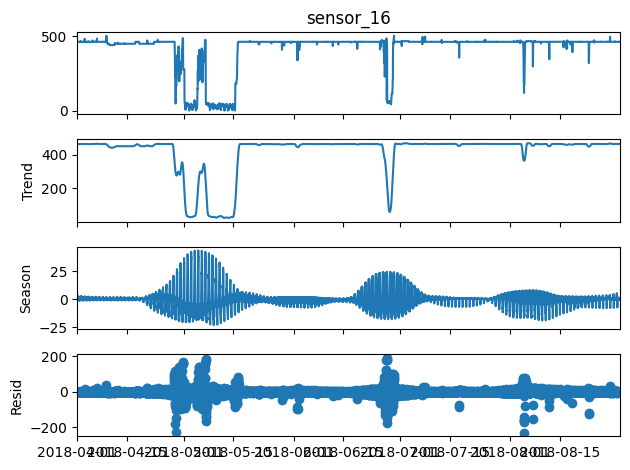

STL Decomposition for sensor_17


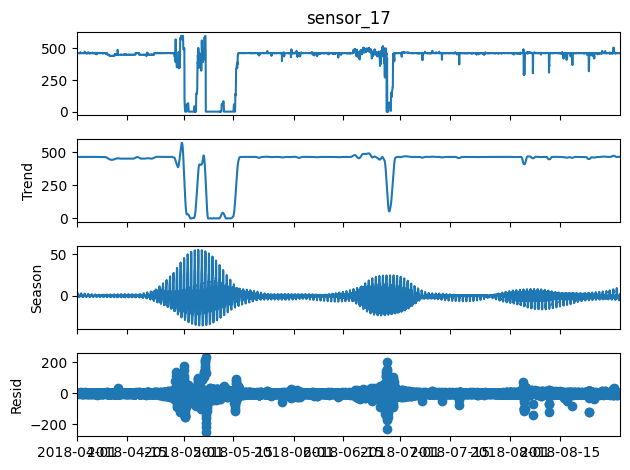

STL Decomposition for sensor_18


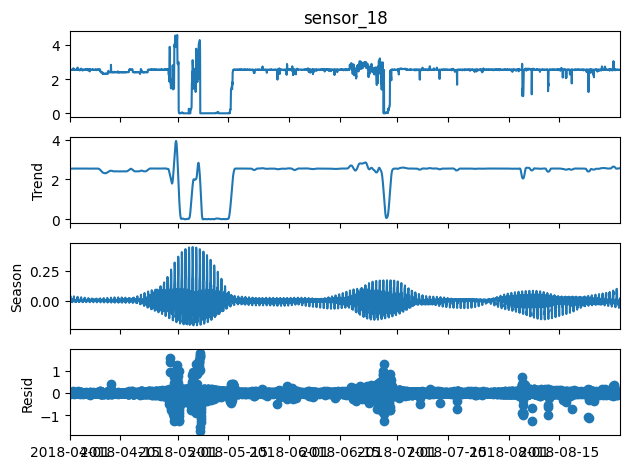

STL Decomposition for sensor_19


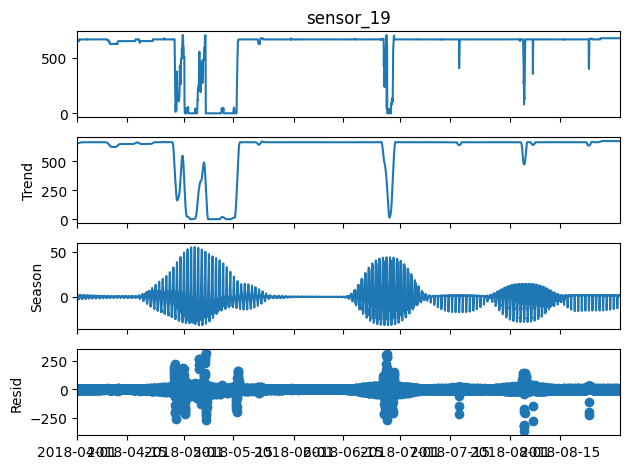

STL Decomposition for sensor_20


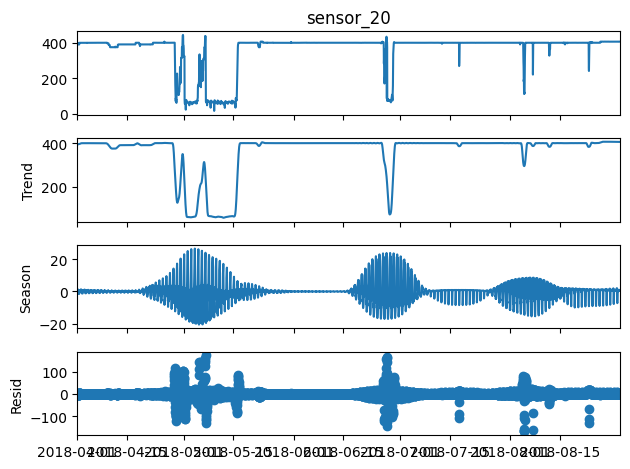

STL Decomposition for sensor_21


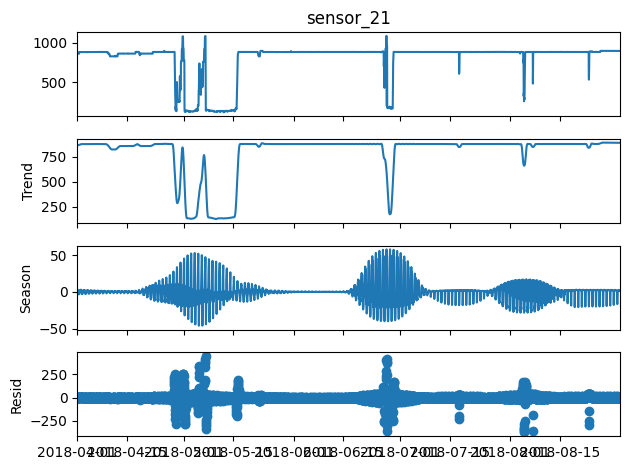

STL Decomposition for sensor_22


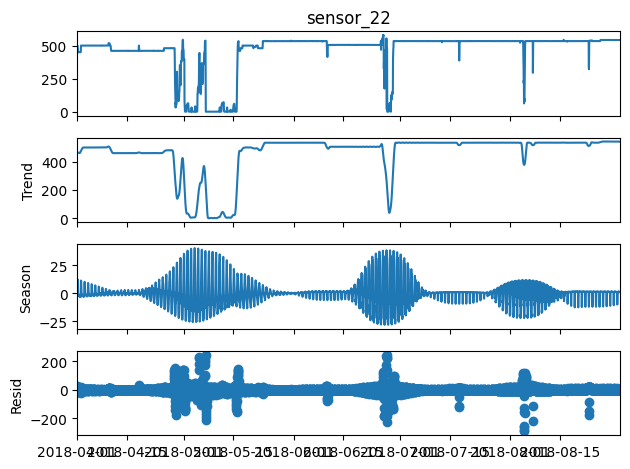

STL Decomposition for sensor_23


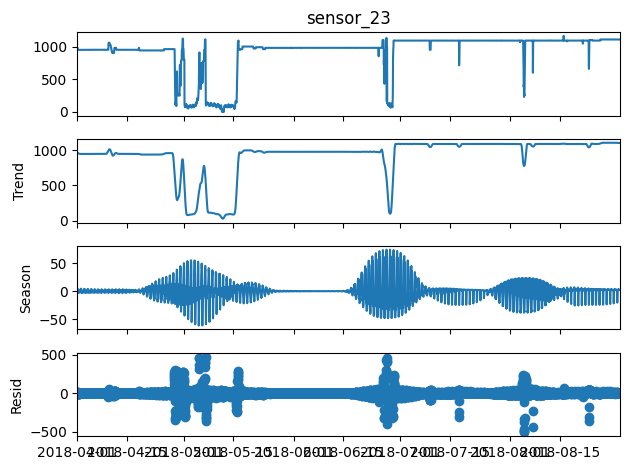

STL Decomposition for sensor_24


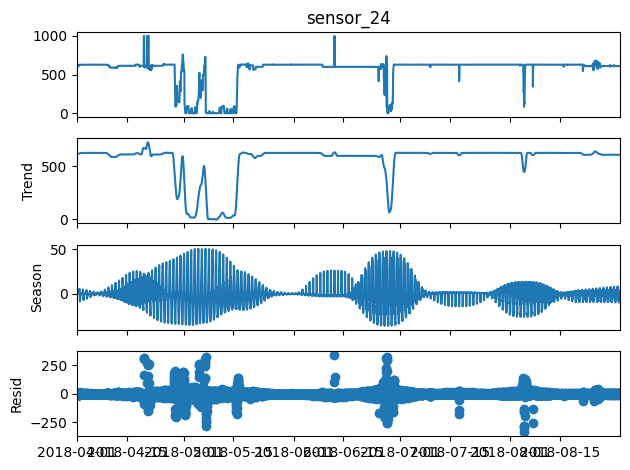

STL Decomposition for sensor_25


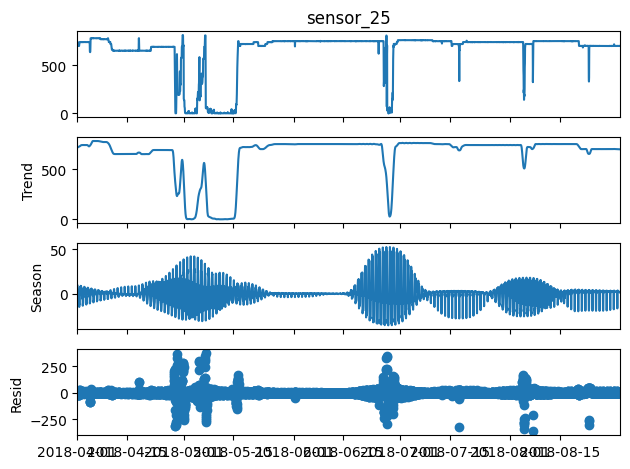

STL Decomposition for sensor_26


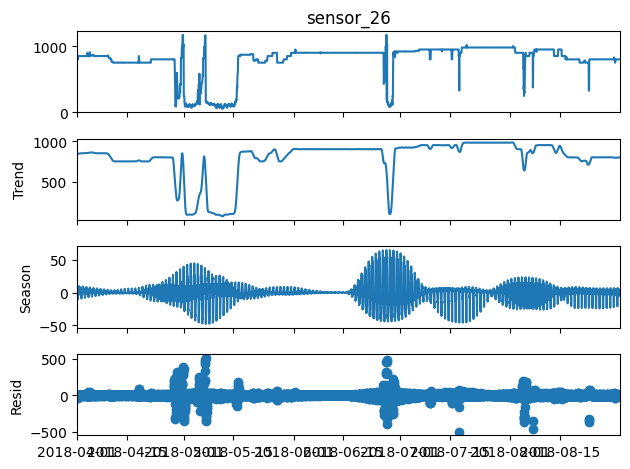

STL Decomposition for sensor_27


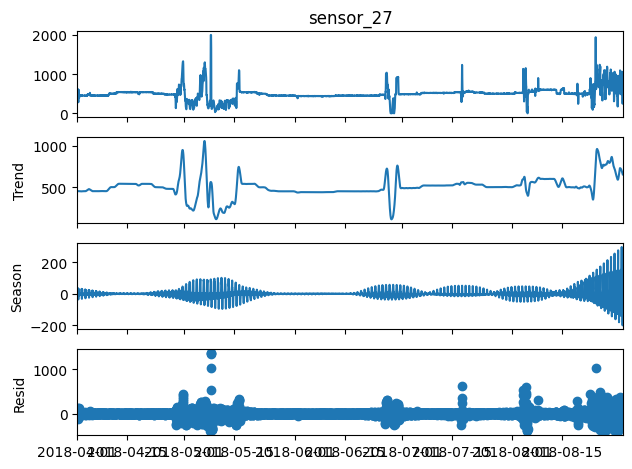

STL Decomposition for sensor_28


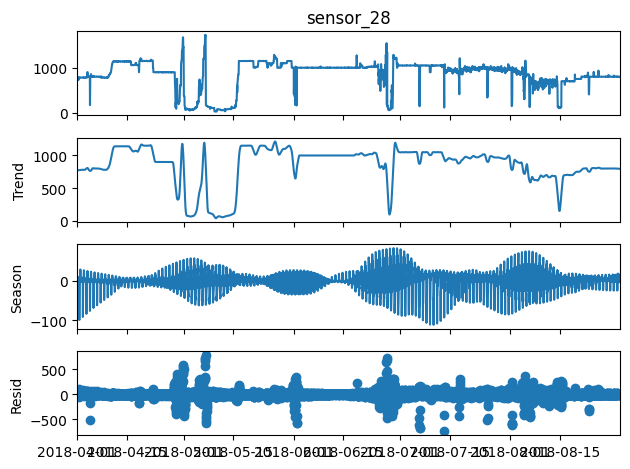

STL Decomposition for sensor_29


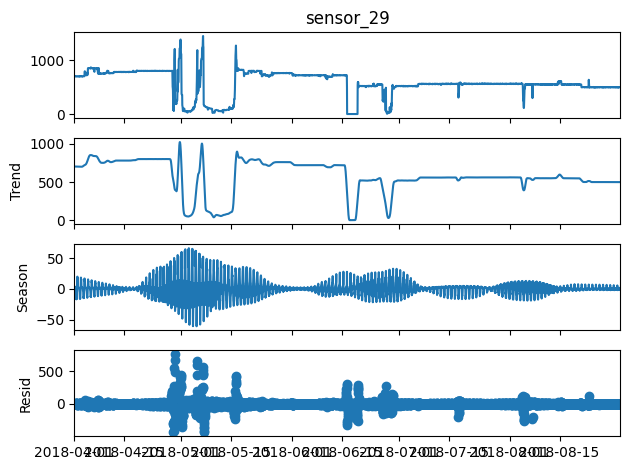

STL Decomposition for sensor_30


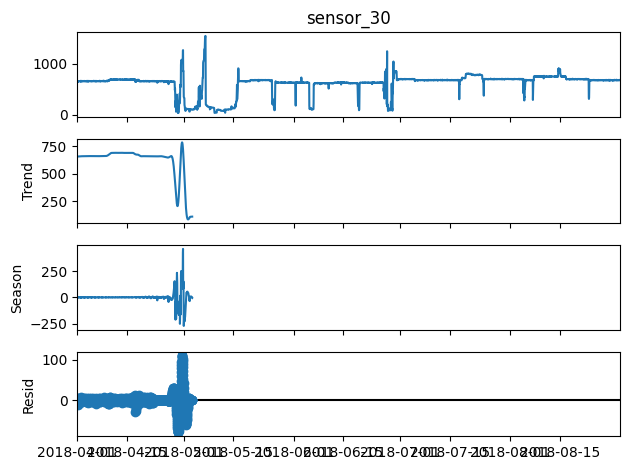

STL Decomposition for sensor_31


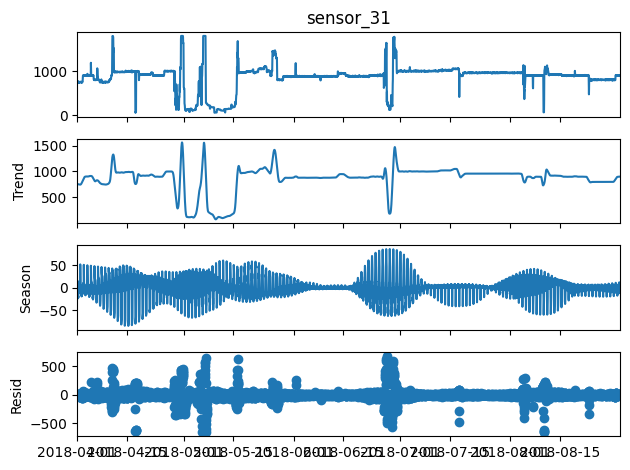

STL Decomposition for sensor_32


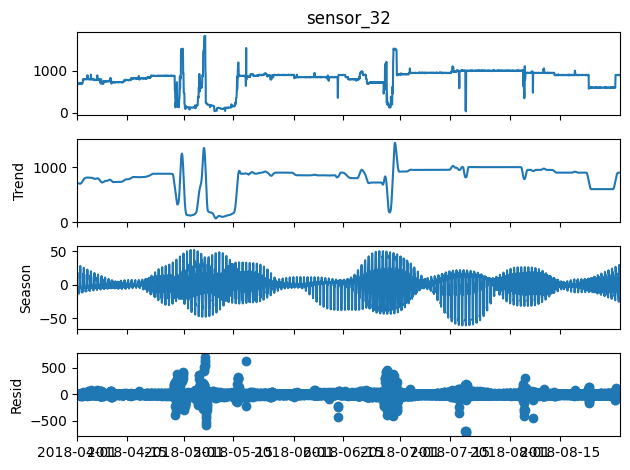

STL Decomposition for sensor_33


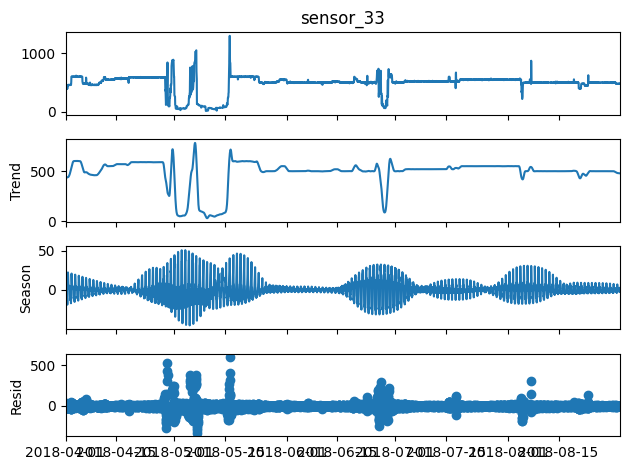

STL Decomposition for sensor_34


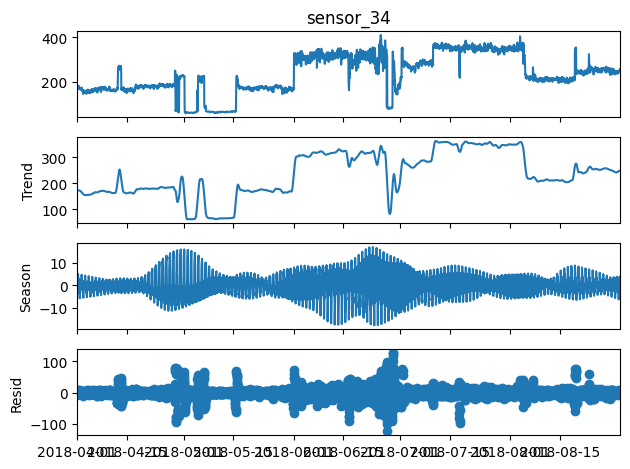

STL Decomposition for sensor_35


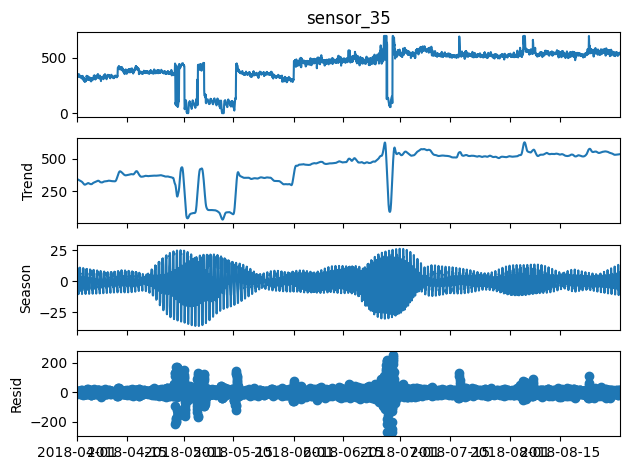

STL Decomposition for sensor_36


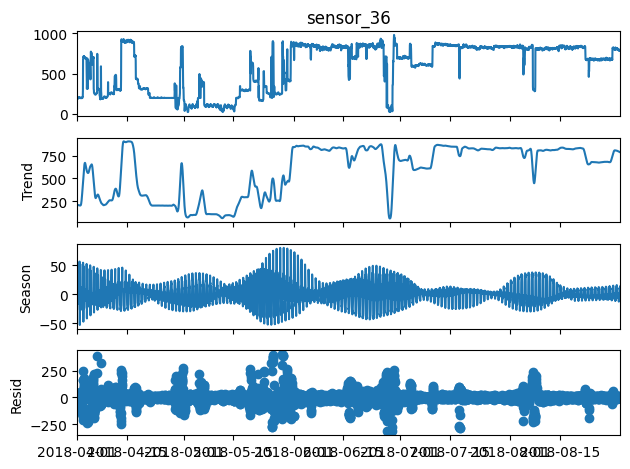

STL Decomposition for sensor_37


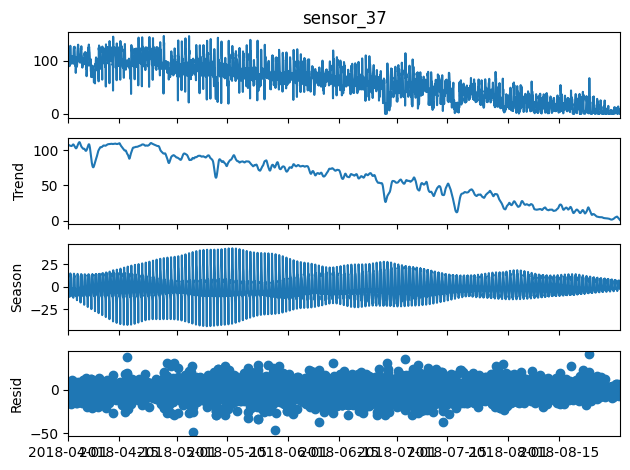

STL Decomposition for sensor_38


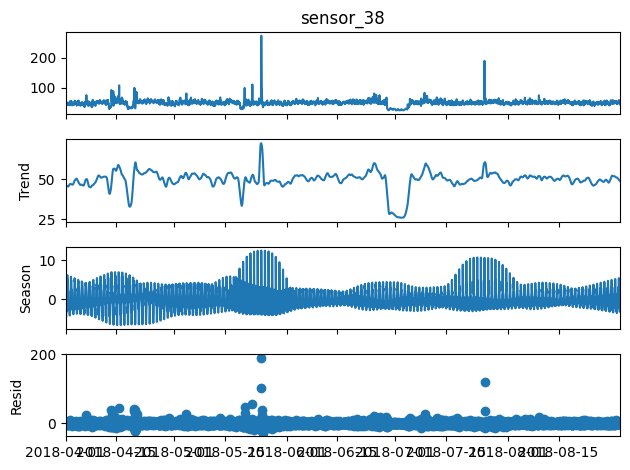

STL Decomposition for sensor_39


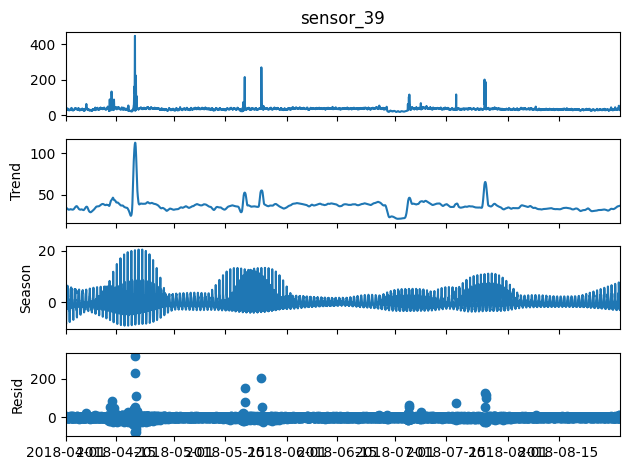

STL Decomposition for sensor_40


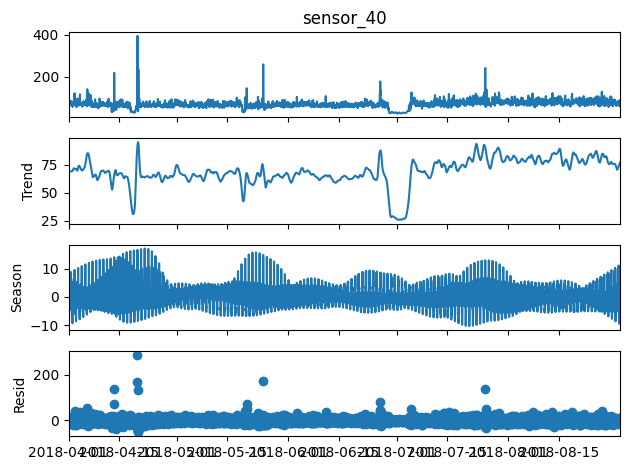

STL Decomposition for sensor_41


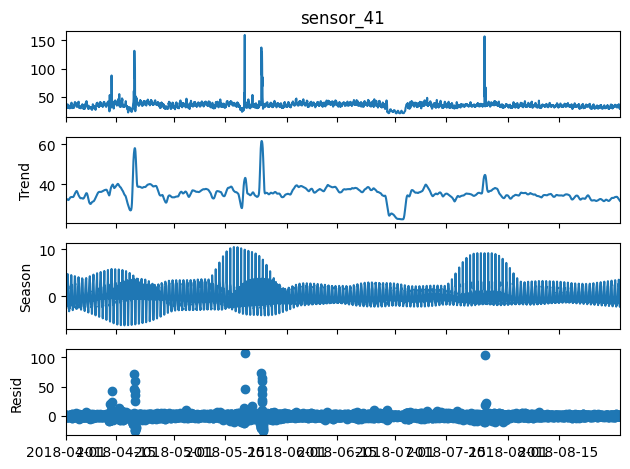

STL Decomposition for sensor_42


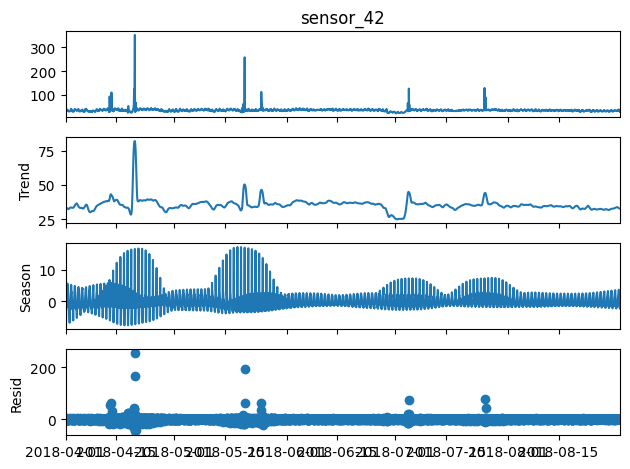

STL Decomposition for sensor_43


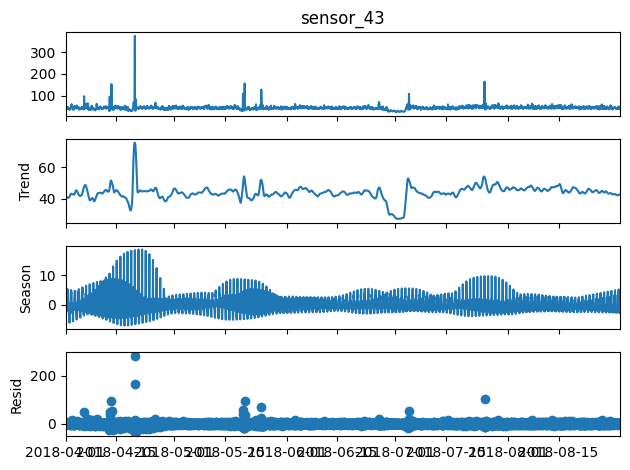

STL Decomposition for sensor_44


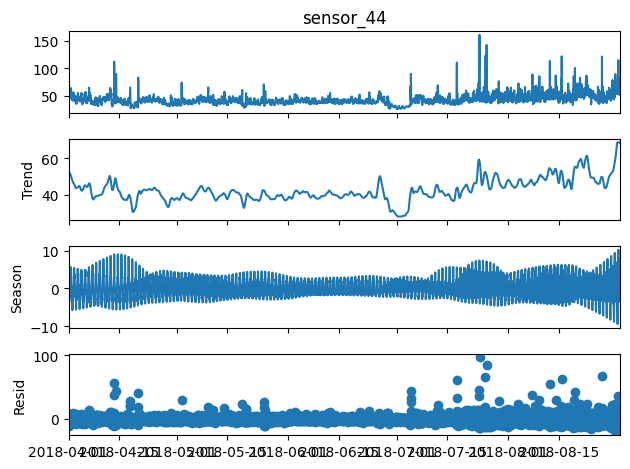

STL Decomposition for sensor_45


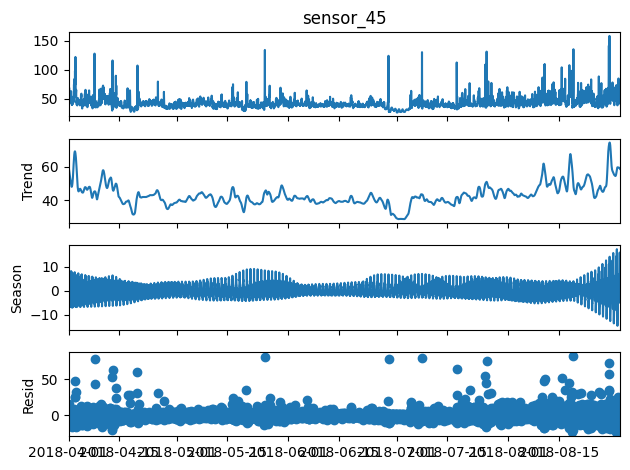

STL Decomposition for sensor_46


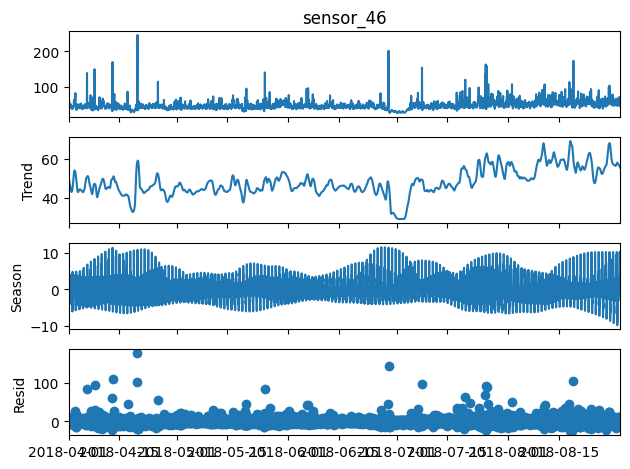

STL Decomposition for sensor_47


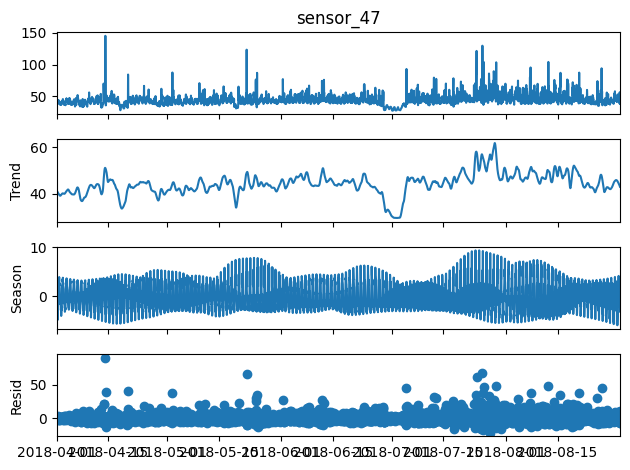

STL Decomposition for sensor_48


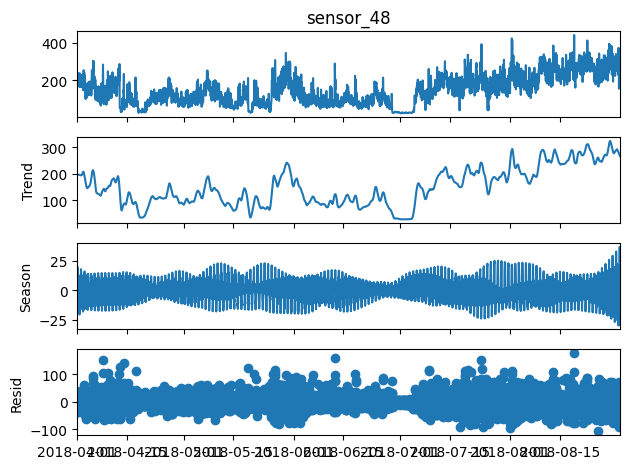

STL Decomposition for sensor_49


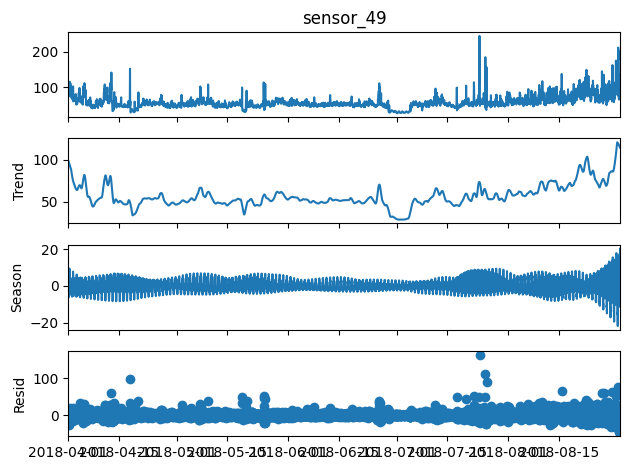

STL Decomposition for sensor_50


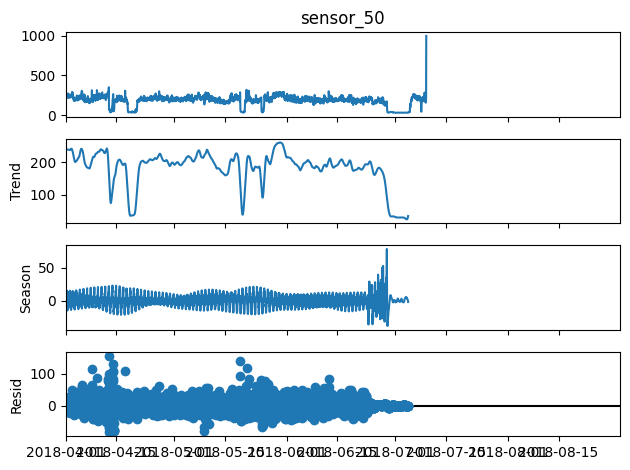

STL Decomposition for sensor_51


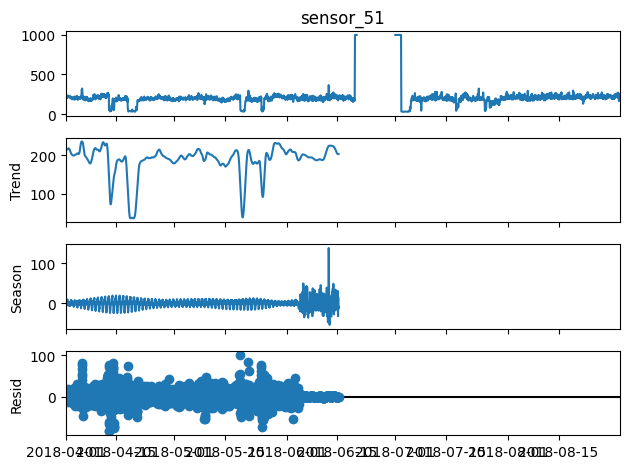

In [ ]:
num_cols = df.select_dtypes(include=['number']).columns.tolist()
# Resample to hourly data for minute-level frequency
df_hourly = df[num_cols].resample('H').mean()

# Apply STL decomposition on each resampled numerical column
for col in df_hourly.columns:
    print(f"STL Decomposition for {col}")
    stl = STL(df_hourly[col], seasonal=25)  # Using 25 as an approximation for daily cycle
    result = stl.fit()
    result.plot()
    plt.show()

## Missing Values

In [ ]:
# Drops sensor_15 due to complete lack of data
df.drop('sensor_15', axis = 1, inplace = True)
num_cols = df.select_dtypes(include=['number']).columns.tolist()

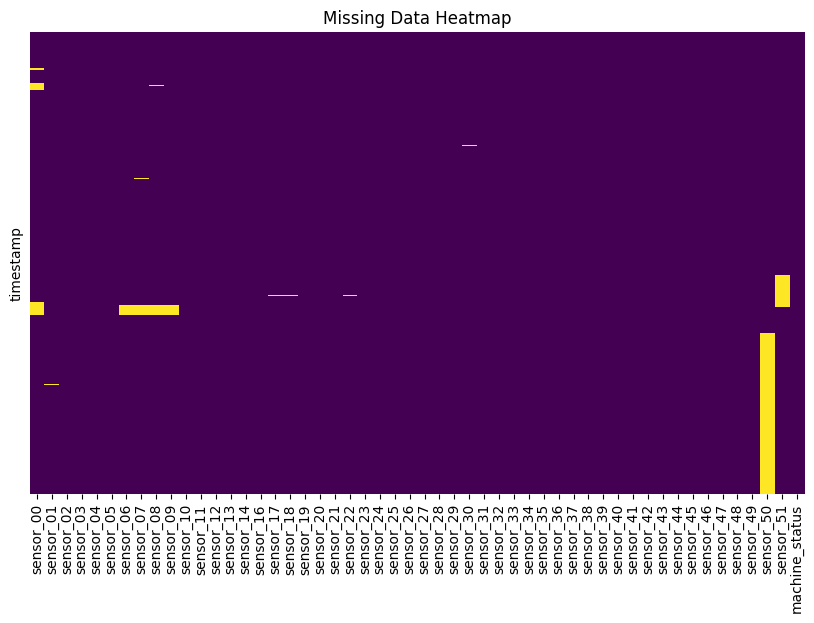

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Missing Data Heatmap')
plt.show()

In [ ]:
na_cols = missing_values_table(df, na_name=True)

           n_miss  ratio
sensor_50   77017  34.96
sensor_51   15383   6.98
sensor_00   10208   4.63
sensor_07    5451   2.47
sensor_08    5107   2.32
sensor_06    4798   2.18
sensor_09    4595   2.09
sensor_01     369   0.17
sensor_30     261   0.12
sensor_29      72   0.03
sensor_32      68   0.03
sensor_18      46   0.02
sensor_17      46   0.02
sensor_22      41   0.02
sensor_25      36   0.02
sensor_16      31   0.01
sensor_41      27   0.01
sensor_39      27   0.01
sensor_40      27   0.01
sensor_42      27   0.01
sensor_38      27   0.01
sensor_43      27   0.01
sensor_44      27   0.01
sensor_45      27   0.01
sensor_46      27   0.01
sensor_47      27   0.01
sensor_48      27   0.01
sensor_49      27   0.01
sensor_14      21   0.01
sensor_26      20   0.01
sensor_02      19   0.01
sensor_03      19   0.01
sensor_05      19   0.01
sensor_10      19   0.01
sensor_11      19   0.01
sensor_12      19   0.01
sensor_04      19   0.01
sensor_13      19   0.01
sensor_33      16   0.01


In [ ]:
# Examination of the Relationship Between Missing Values and the target variable
for col in na_cols:
    result = missing_vs_target(df, col, 'machine_status')
    print('\n' + '#'*5 + ' ' +  col + ' ' + '#'*5 + '\n')
    print(result)


##### sensor_00 #####

                Missing Count  Total Count  Missing Ratio (%)
machine_status                                               
BROKEN                   0.00            7               0.00
NORMAL                  14.00       205836               0.01
RECOVERING           10194.00        14477              70.42

##### sensor_01 #####

                Missing Count  Total Count  Missing Ratio (%)
machine_status                                               
BROKEN                   0.00            7               0.00
NORMAL                 339.00       205836               0.16
RECOVERING              30.00        14477               0.21

##### sensor_02 #####

                Missing Count  Total Count  Missing Ratio (%)
machine_status                                               
BROKEN                   0.00            7               0.00
NORMAL                  14.00       205836               0.01
RECOVERING               5.00        14477               0.0

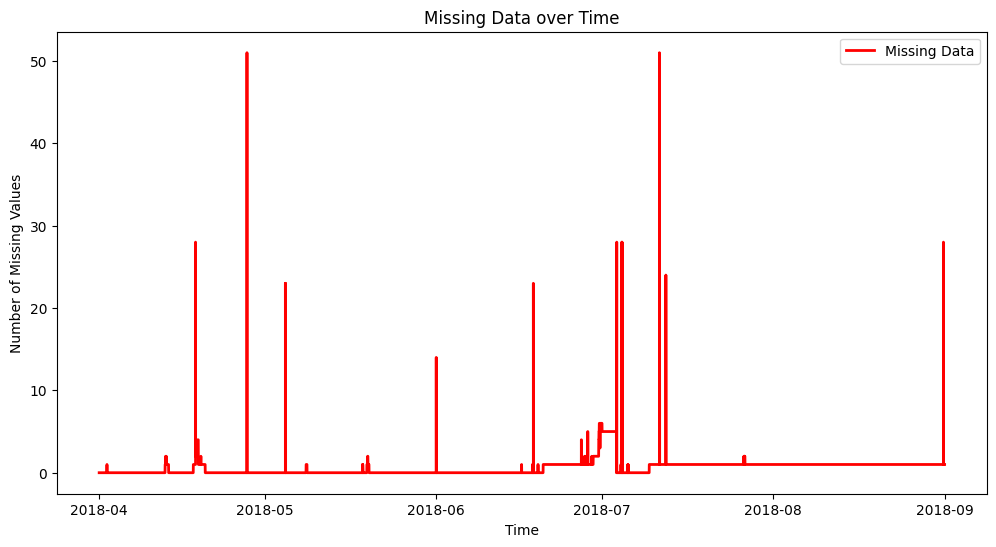

In [ ]:
plt.figure(figsize=(12, 6))
missing_data = df.isnull().sum(axis=1)
plt.plot(df.index, missing_data, label='Missing Data', color='red', lw=2)
plt.title('Missing Data over Time')
plt.xlabel('Time')
plt.ylabel('Number of Missing Values')
plt.legend()
plt.show()

In [ ]:
for sensor in na_cols:
# For sensors with low missing ratios (<1%), use forward fill or backward fill
    missing_ratio = df[sensor].isnull().sum() / len(df) * 100
    if missing_ratio <= 1:
        df[sensor] = df[sensor].ffill().bfill()
# For high missing ratios (>=30%), apply interpolation
    elif missing_ratio >= 30:
        df[sensor] = df[sensor].interpolate(method='linear')
# For low-to-moderate missing ratio (1%-30%), apply KNN imputation
    elif 1 < missing_ratio < 30:
        knn_imputer = KNNImputer(n_neighbors=3)
        df[[sensor]] = knn_imputer.fit_transform(df[[sensor]])

na_cols = missing_values_table(df, na_name=True)

Empty DataFrame
Columns: [n_miss, ratio]
Index: []


In [ ]:
check_df(df)


 ############### DataFrame Overview ###############

 - Shape of DataFrame: (220320, 52)

 ############### DataFrame Info ############### 

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 220320 entries, 2018-04-01 00:00:00 to 2018-08-31 23:59:00
Freq: min
Data columns (total 52 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   sensor_00       220320 non-null  float64
 1   sensor_01       220320 non-null  float64
 2   sensor_02       220320 non-null  float64
 3   sensor_03       220320 non-null  float64
 4   sensor_04       220320 non-null  float64
 5   sensor_05       220320 non-null  float64
 6   sensor_06       220320 non-null  float64
 7   sensor_07       220320 non-null  float64
 8   sensor_08       220320 non-null  float64
 9   sensor_09       220320 non-null  float64
 10  sensor_10       220320 non-null  float64
 11  sensor_11       220320 non-null  float64
 12  sensor_12       220320 non-null  float64
 13  sensor_13

## Outliers Analysis

In [ ]:
# Identify columns with outliers
outlier_cols = [col for col in num_cols if check_outlier(df, col)]
print(f"Counts the number of columns with detected outliers: {len(outlier_cols)}")
print("Columns with Detected Outliers")
outlier_cols

Counts the number of columns with detected outliers: 20
Columns with Detected Outliers


['sensor_00',
 'sensor_01',
 'sensor_06',
 'sensor_07',
 'sensor_08',
 'sensor_09',
 'sensor_27',
 'sensor_33',
 'sensor_38',
 'sensor_39',
 'sensor_40',
 'sensor_41',
 'sensor_42',
 'sensor_43',
 'sensor_44',
 'sensor_45',
 'sensor_46',
 'sensor_47',
 'sensor_49',
 'sensor_51']

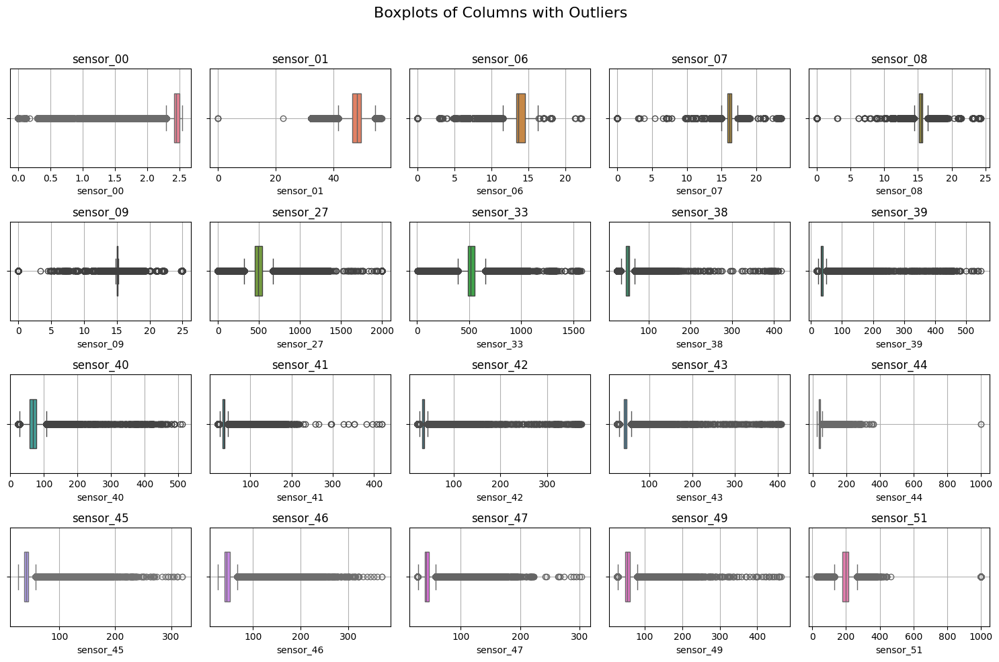

In [ ]:
# Set colors for the plots
colors = sns.color_palette("husl", len(outlier_cols))

# Determine the number of columns and rows for the grid
n_cols = 5
n_rows = int(np.ceil(len(outlier_cols) / n_cols))

# Create the subplots figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 2.5))
fig.suptitle('Boxplots of Columns with Outliers', fontsize=16)
axes = axes.flatten()  # Flatten to easily iterate over axes

# Plot each column with outliers as a boxplot
for i, col in enumerate(outlier_cols):
    sns.boxplot(x=df[col], color=colors[i], orient='h', width=0.5, ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_xlabel(col)
    axes[i].grid(True)

# Hide any extra subplots if the number of columns is not a multiple of n_cols
for ax in axes[len(outlier_cols):]:
    ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the main title
plt.show()


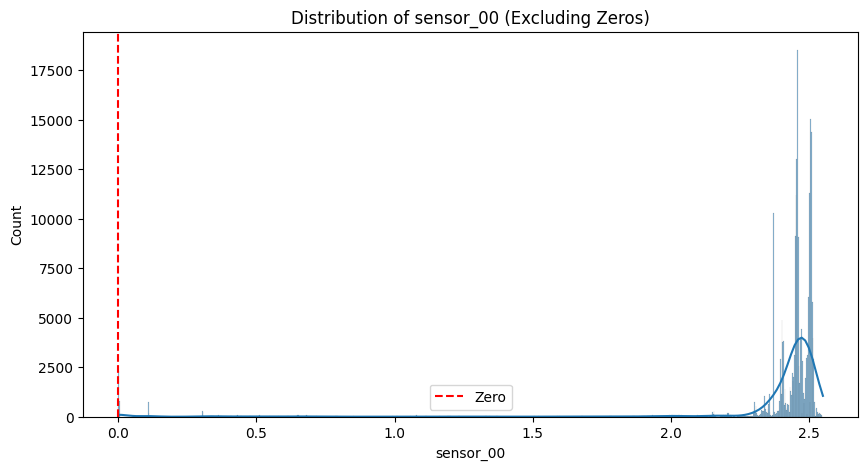

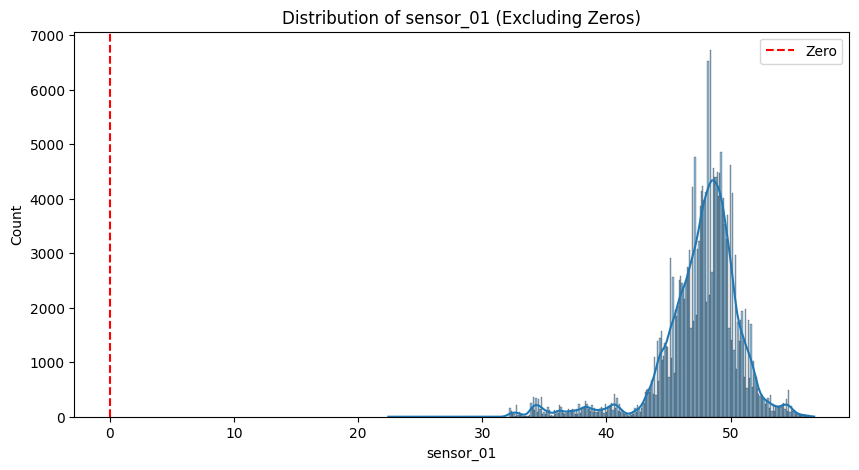

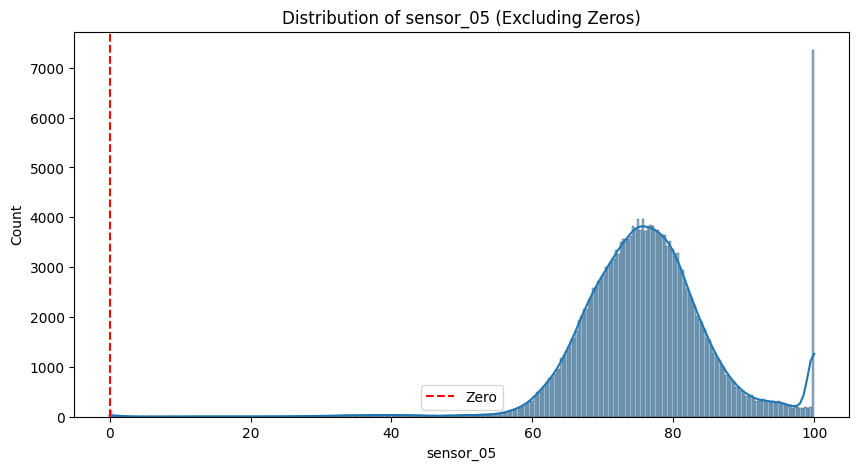

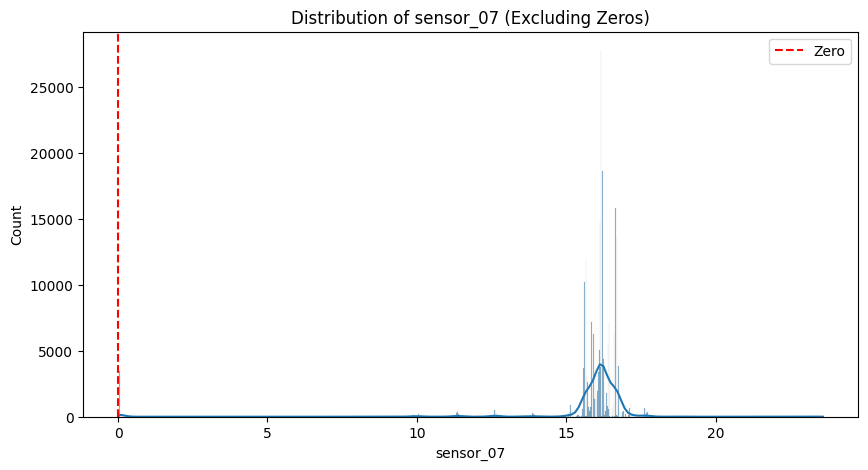

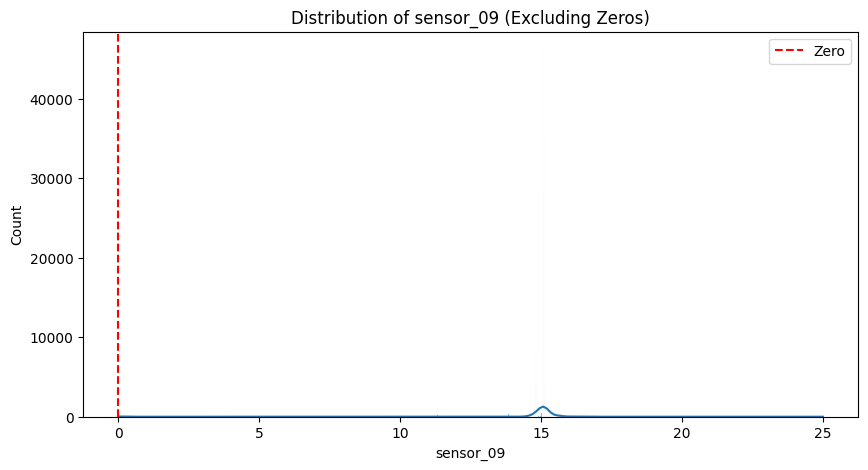

...

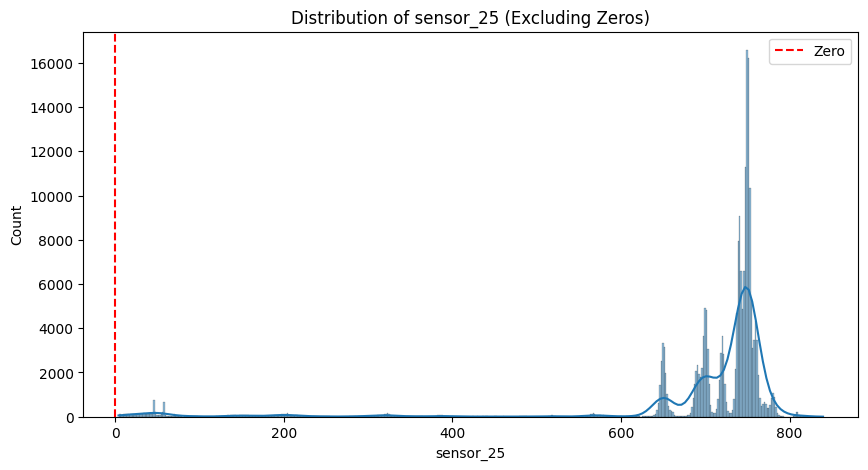

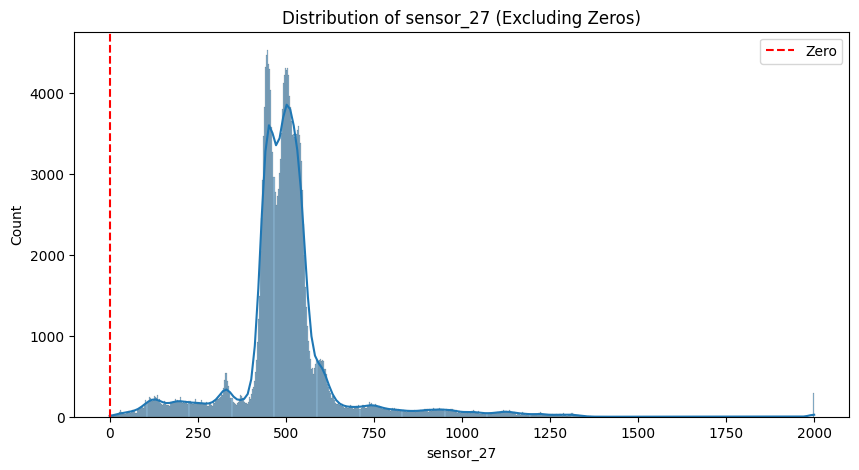

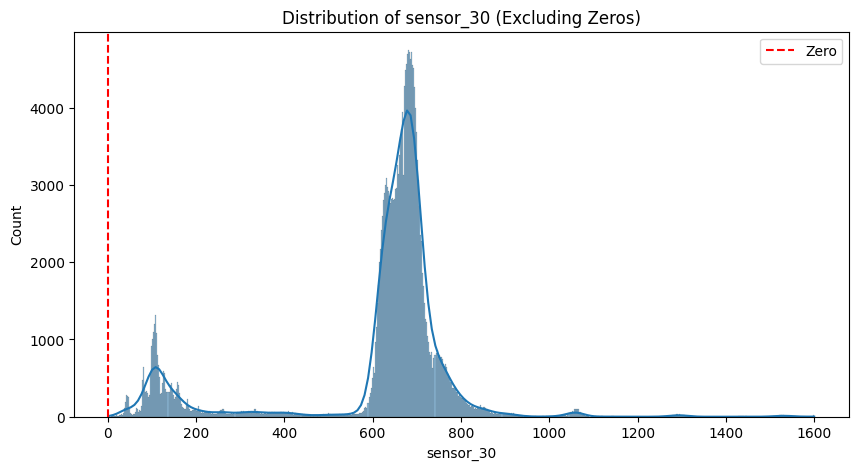

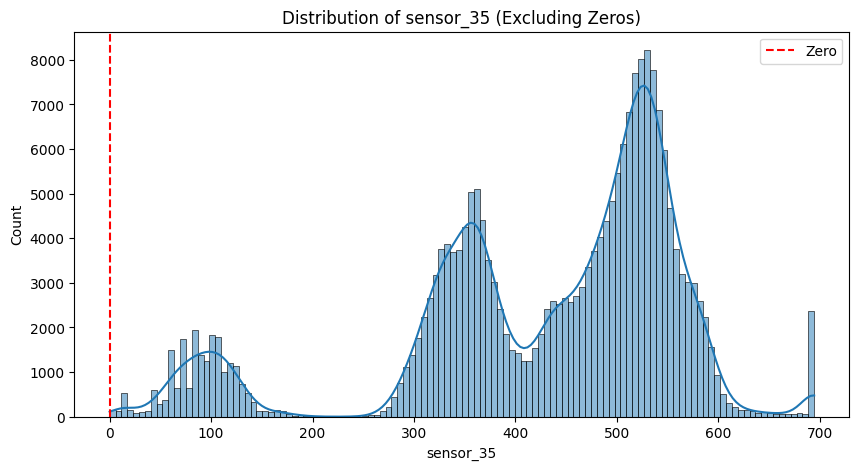

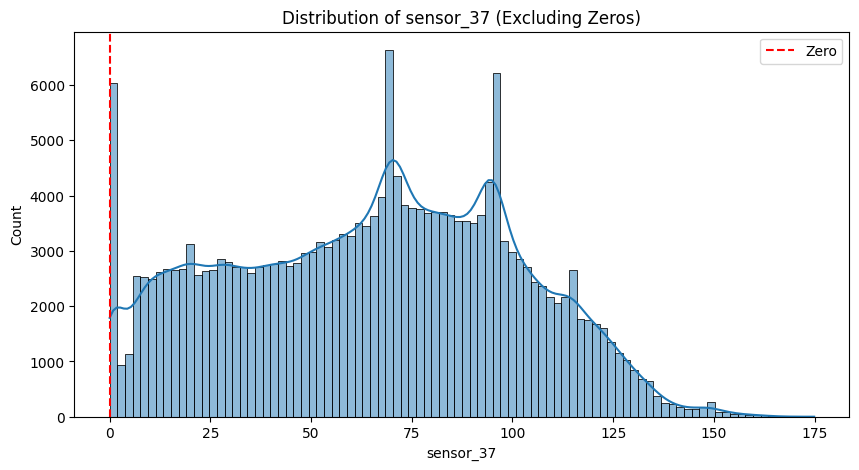

In [ ]:
# Examine the distribution of non-zero values
for sensor_column in sensors_with_zero_min:
    plt.figure(figsize=(10, 5))

    sns.histplot(df[sensor_column][df[sensor_column] != 0], kde=True)
    plt.axvline(0, color='red', linestyle='--', label='Zero')
    plt.title(f'Distribution of {sensor_column} (Excluding Zeros)')
    plt.legend()
    plt.show()

If the zero value appears outside the distribution range, it can be considered as NaN. If it looks like part of the distribution, it can remain as zero.

In [ ]:
# Outlier Handling Problem - Capping Method (Re-assignment with thresholds)
for col in num_cols:
    replace_with_thresholds(df, col)

In [ ]:
outlier_cols = [col for col in num_cols if check_outlier(df, col)]
print(f"Counts the number of columns with detected outliers: {len(outlier_cols)}")

Counts the number of columns with detected outliers: 0


## Correlation Analysis

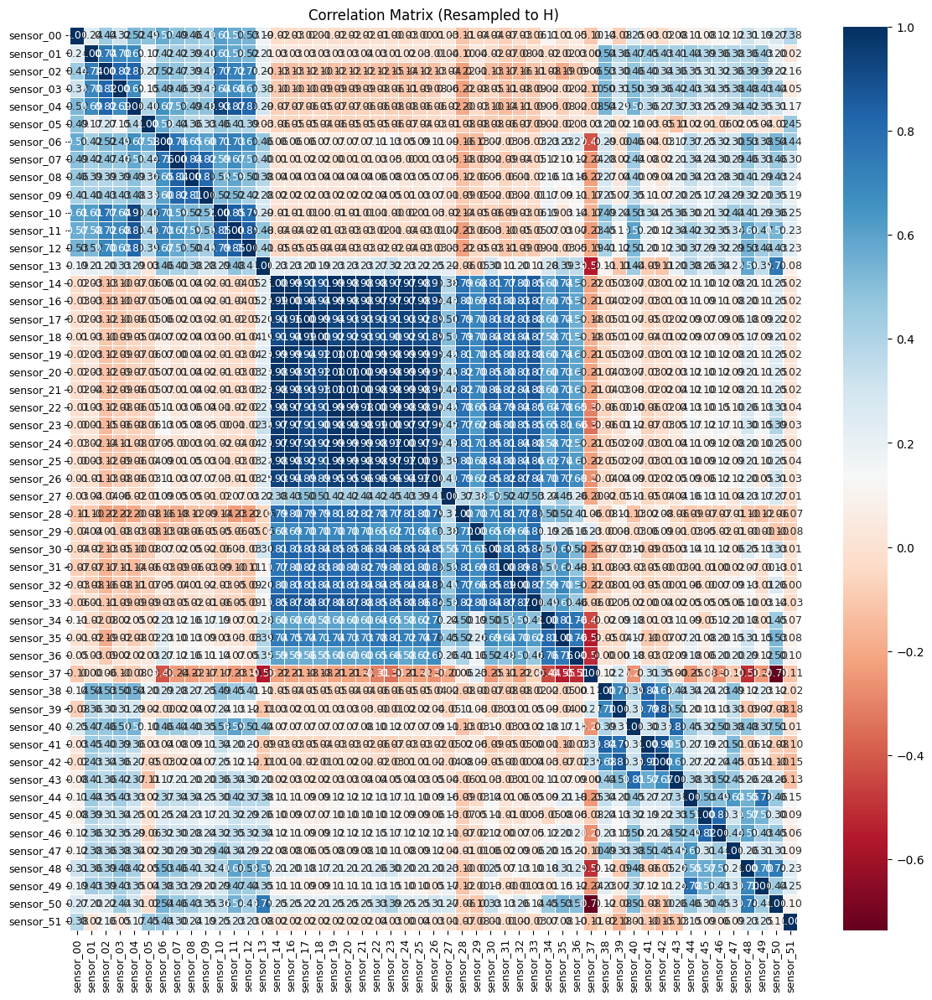

In [ ]:
drop_list_Hour = high_correlated_cols_time_series(df[num_cols], resample_freq='H')

In [ ]:
print(f"Counts the number of columns with detected high correlated columns: {drop_list_Hour}")
len(drop_list_Hour)

Counts the number of columns with detected high correlated columns: ['sensor_10', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25', 'sensor_26']


12

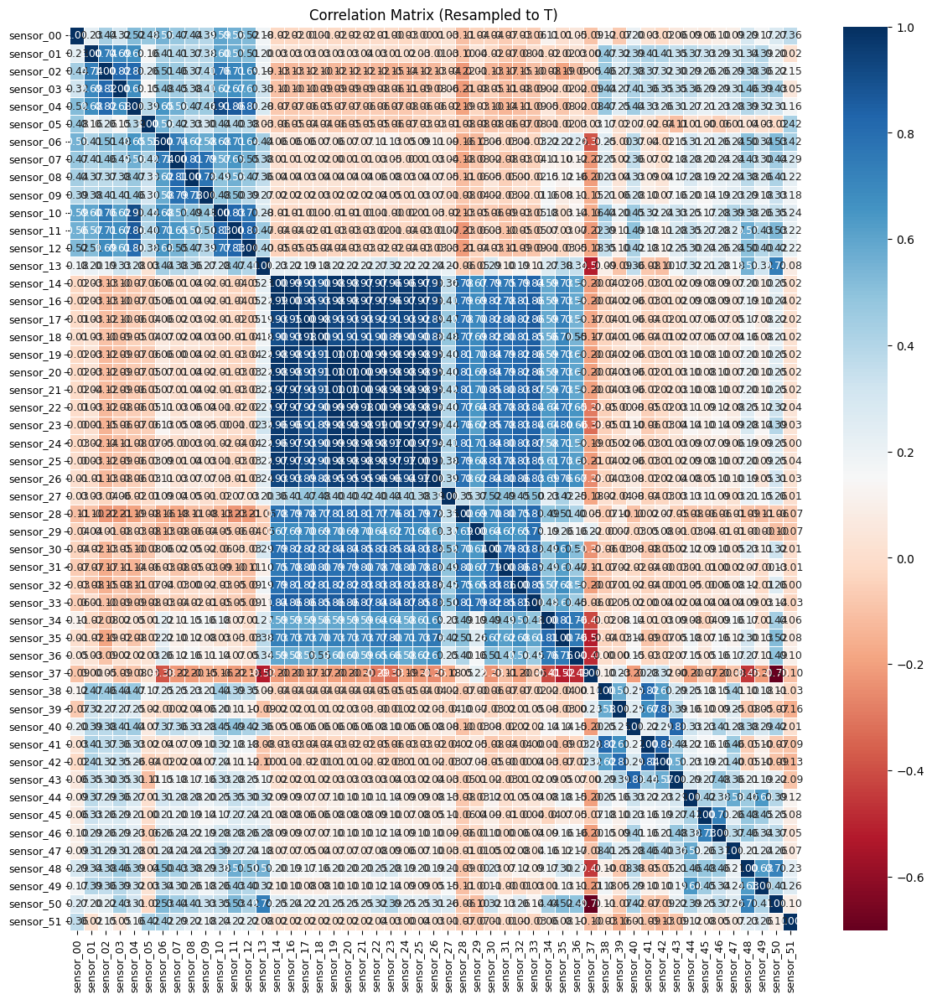

In [ ]:
drop_list_Minute = high_correlated_cols_time_series(df[num_cols], resample_freq="T")

In [ ]:
print(f"Counts the number of columns with detected high correlated columns: {drop_list_Minute}")
len(drop_list_Minute)

Counts the number of columns with detected high correlated columns: ['sensor_10', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25', 'sensor_26']


12

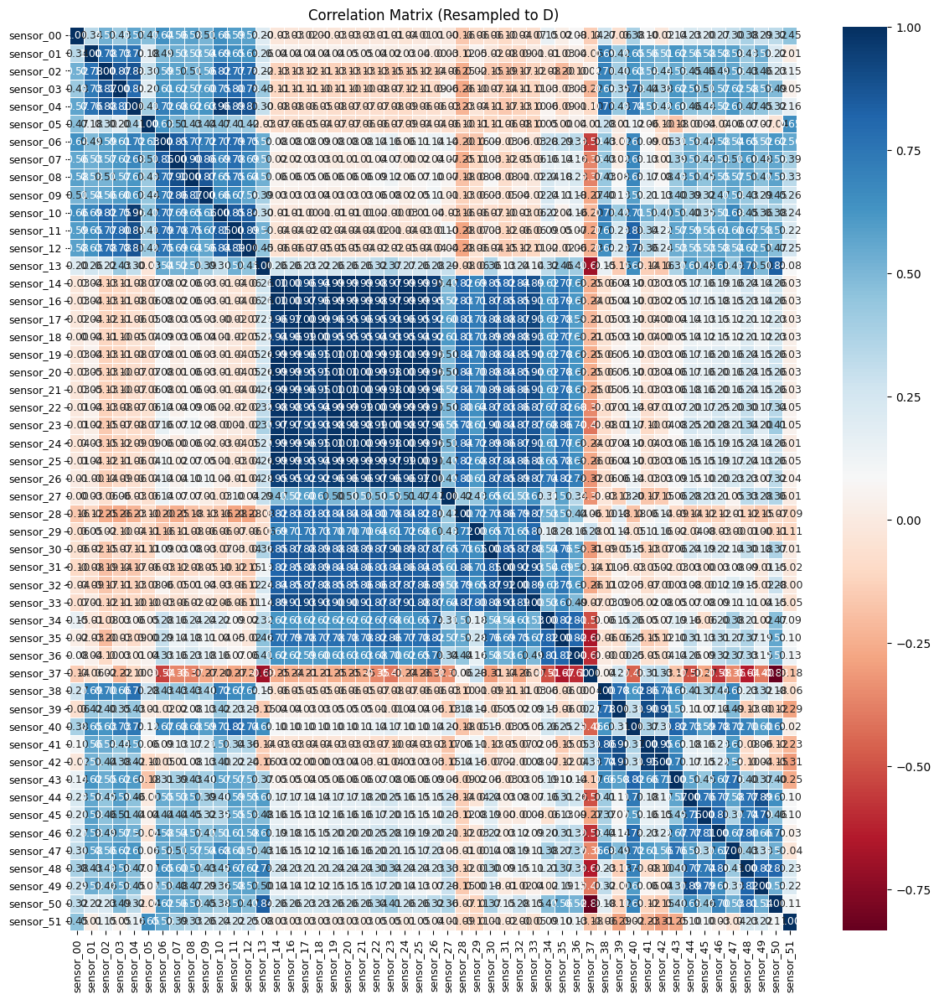

In [ ]:
drop_list_Day = high_correlated_cols_time_series(df[num_cols], resample_freq="D")

In [ ]:
print(f"Counts the number of columns with detected high correlated columns: {drop_list_Day}")
len(drop_list_Day)

Counts the number of columns with detected high correlated columns: ['sensor_10', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25', 'sensor_26', 'sensor_32', 'sensor_33', 'sensor_41', 'sensor_42']


16

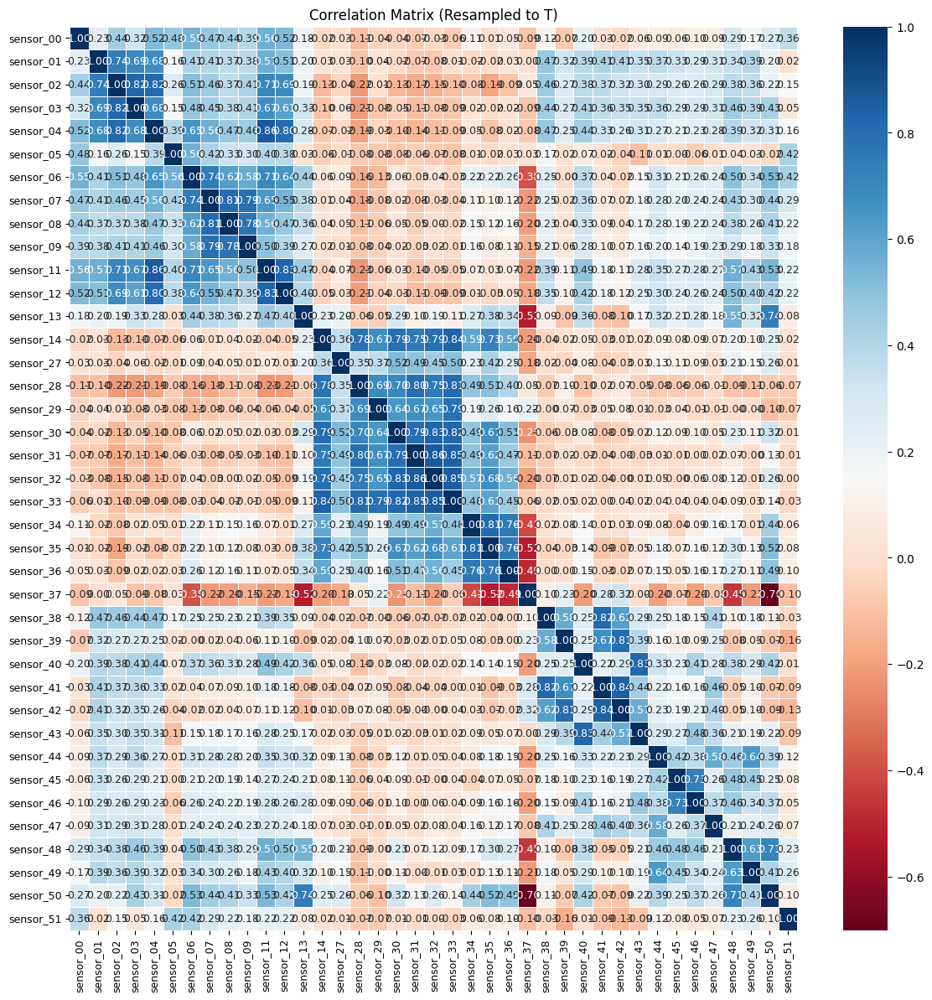

In [ ]:
# We are going to focus on the minute-level analysis because we are interested in very short-term dependencies like detecting rapid cahanges/minute level anomalies.
high_correlated_cols_time_series(df[num_cols].drop(drop_list_Minute, axis=1))
df = df.drop(drop_list_Minute, axis=1)

In [ ]:
check_df(df)
df.to_csv('/content/drive/MyDrive/cleaned_sensor_data.csv')


 ############### DataFrame Overview ###############

 - Shape of DataFrame: (220320, 40)

 ############### DataFrame Info ############### 

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 220320 entries, 2018-04-01 00:00:00 to 2018-08-31 23:59:00
Freq: min
Data columns (total 40 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   sensor_00       220320 non-null  float64
 1   sensor_01       220320 non-null  float64
 2   sensor_02       220320 non-null  float64
 3   sensor_03       220320 non-null  float64
 4   sensor_04       220320 non-null  float64
 5   sensor_05       220320 non-null  float64
 6   sensor_06       220320 non-null  float64
 7   sensor_07       220320 non-null  float64
 8   sensor_08       220320 non-null  float64
 9   sensor_09       220320 non-null  float64
 10  sensor_11       220320 non-null  float64
 11  sensor_12       220320 non-null  float64
 12  sensor_13       220320 non-null  float64
 13  sensor_14

In [ ]:
df_cleaned = pd.read_csv('/content/drive/MyDrive/cleaned_sensor_data.csv')
df_cleaned.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_11,sensor_12,sensor_13,sensor_14,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,sensor_35,sensor_36,sensor_37,sensor_38,sensor_39,sensor_40,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
0,2018-04-01 00:00:00,2.47,47.09,53.21,46.31,634.38,76.46,13.41,16.13,15.57,15.05,47.52,31.12,1.68,419.57,429.04,785.19,684.94,594.44,682.81,680.44,433.70,171.94,341.90,195.07,90.32,40.36,31.51,70.57,30.99,31.77,41.93,39.64,65.68,50.93,38.19,157.99,67.71,243.06,201.39,NORMAL
1,2018-04-01 00:01:00,2.47,47.09,53.21,46.31,634.38,76.46,13.41,16.13,15.57,15.05,47.52,31.12,1.68,419.57,429.04,785.19,684.94,594.44,682.81,680.44,433.70,171.94,341.90,195.07,90.32,40.36,31.51,70.57,30.99,31.77,41.93,39.64,65.68,50.93,38.19,157.99,67.71,243.06,201.39,NORMAL
2,2018-04-01 00:02:00,2.44,47.35,53.21,46.40,638.89,73.55,13.32,16.04,15.62,15.01,48.18,32.09,1.71,420.85,454.24,778.57,715.63,661.57,721.88,694.77,441.26,169.98,343.20,200.97,93.91,41.41,31.25,69.53,30.47,31.77,41.67,39.35,65.39,51.22,38.19,155.96,67.13,241.32,203.70,NORMAL
3,2018-04-01 00:03:00,2.46,47.09,53.17,46.40,628.12,76.99,13.32,16.25,15.70,15.08,48.66,31.67,1.58,420.75,474.87,779.51,690.40,686.11,754.69,683.38,446.25,166.50,343.96,193.17,101.04,41.93,31.51,72.14,30.47,31.51,40.89,39.06,64.81,51.22,38.19,155.96,66.84,240.45,203.12,NORMAL
4,2018-04-01 00:04:00,2.45,47.14,53.21,46.40,636.46,76.59,13.35,16.21,15.70,15.08,49.06,31.95,1.68,419.89,408.82,785.23,704.69,631.48,766.15,702.44,433.91,164.75,339.96,193.88,101.70,42.71,31.51,76.82,30.99,31.51,41.41,38.77,65.10,51.79,38.77,158.28,66.55,242.19,201.39,NORMAL


# **Conclusion**
This notebook provides a thorough data wrangling and exploratory data analysis (EDA) process, preparing the dataset for feature engineering and modeling. The key steps include:

* Data Summary and Initial Inspection: Comprehensive overview functions display essential information about the dataset's structure, types, missing values, and basic statistics.

* Missing Value Analysis: Functions for identifying and examining missing values help assess their impact, allowing for informed decisions on handling or imputing these values.

* Outlier Detection and Treatment: Using quantile-based thresholds, the notebook identifies and caps outliers to mitigate their potential impact on analysis and modeling.

* Correlation Analysis with Resampling: High-correlation features are identified through resampling at different frequencies, along with a heatmap visualization to assess feature redundancy. This step is crucial for time series datasets to manage multicollinearity effectively.

These steps provide a robust foundation, addressing data quality issues and uncovering key patterns in the data. The dataset is now well-prepared for the next stage: feature engineering and model development.